In [1]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import os
import scipy.signal as sgn
from scipy.optimize import minimize
from matplotlib.patches import Rectangle
from mpl_toolkits import mplot3d
# %matplotlib inline
%matplotlib ipympl
%matplotlib ipympl

In [2]:
from scipy.optimize import curve_fit

## 2d and 3d Plots of Axis Lengths, Their Differences, and Angles.

## Ellipse fitting and Visual Extrapolation

In [3]:
save_arr_dir = 'C:/Users/Kazim/Desktop/Overall/VignettingCircleDetection/savedarrays/091123_ellipse_cv2_fit_tiff_size/'
fit_range = np.loadtxt(f'{save_arr_dir}fit_range.txt').reshape([7, 7])
center_cords = np.loadtxt(f'{save_arr_dir}center.txt').reshape([7, 7, 2])
axis_lens = np.loadtxt(f'{save_arr_dir}axis_lens.txt').reshape([7, 7, 2])
angles_saved = np.loadtxt(f'{save_arr_dir}angles_all.txt').reshape([7, 7])

In [13]:
center_cords_extended = np.loadtxt('extrap_280923/center_cords_extended.txt').reshape(11, 11, 2)
axis_lens_extended = np.loadtxt('extrap_280923/axis_lens_entended.txt').reshape(11, 11, 2)
angles_extended = np.loadtxt('extrap_280923/angles_extended.txt').reshape(11, 11)

In [14]:
center_cords[0, 0] = np.nan, np.nan
center_cords[0, 6] = np.nan, np.nan
center_cords[-1, 0] = np.nan, np.nan
center_cords[-1, 6] = np.nan, np.nan

axis_lens[0, 0] = np.nan, np.nan
axis_lens[0, 6] = np.nan, np.nan
axis_lens[-1, 0] = np.nan, np.nan
axis_lens[-1, 6] = np.nan, np.nan

angles_saved[0, 0] = np.nan
angles_saved[0, -1] = np.nan
angles_saved[-1, 0] = np.nan
angles_saved[-1, -1] = np.nan


axis_lens_extended[2:9, 2:9, 0] = axis_lens[:, :, 1] # ???
axis_lens_extended[2:9, 2:9, 1] = axis_lens[:, :, 0] # ???
center_cords_extended[2:9, 2:9] = center_cords
angles_extended[2:9, 2:9] = angles_saved

In [15]:
axis_lens_extended[1, :2] = [0.0, 0.0]
axis_lens_extended[9, 8:10] = [0.0, 0.0]
axis_lens_extended[9, 8:10] = [0.0, 0.0]
axis_lens_extended[8:10, 9] = [0.0, 0.0]
axis_lens_extended[1, 1] = [0.0, 0.0]
axis_lens_extended[:4, 0] = [0.0, 0.0]
axis_lens_extended[7:, 0] = [0.0, 0.0]

In [18]:
angles_extended[0, :4] = np.nan; angles_extended[0, 7:] = np.nan
angles_extended[1, :2] = np.nan; angles_extended[1, 9:] = np.nan
angles_extended[2, 0] = np.nan; angles_extended[2, -1] = np.nan
angles_extended[3, 0] = np.nan; angles_extended[3, -1] = np.nan
angles_extended[4, -1] = np.nan
angles_extended[6, -1] = np.nan
angles_extended[7, 0] = np.nan; angles_extended[7, -1] = np.nan
angles_extended[8, 0] = np.nan; angles_extended[8, -2:] = np.nan
angles_extended[9, :2] = np.nan; angles_extended[9, -3:] = np.nan
angles_extended[10, :] = np.nan

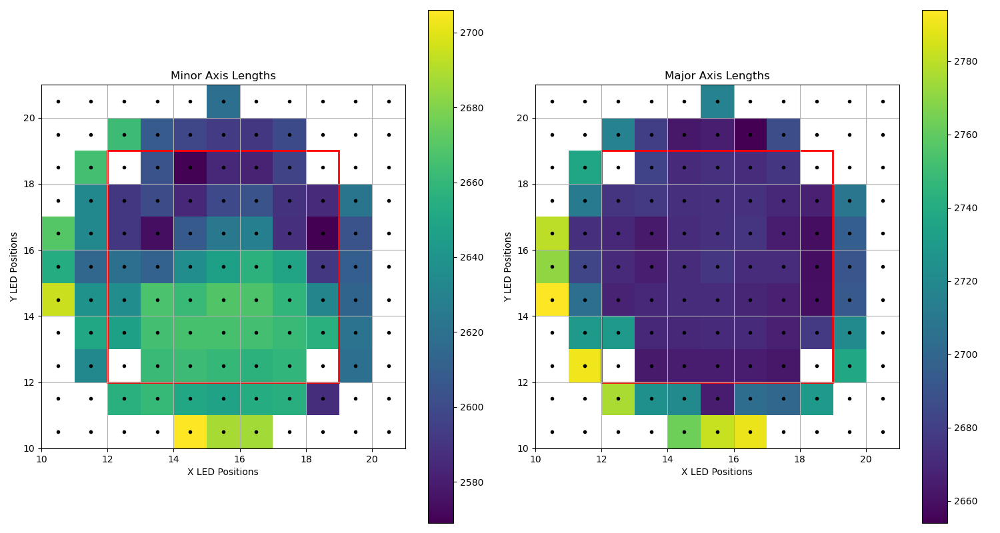

In [22]:
axis_lens_extended[np.where(axis_lens_extended==0.)] = np.nan

fig, ax = plt.subplots(1, 2, figsize=(15, 8), layout='tight')

xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])

cp = ax[0].imshow(np.array([list(reversed(axis_lens_extended[i, :])) for i in range(axis_lens_extended.shape[0])])[:, :, 1].T, interpolation='none',
                  extent=[10, 21, 10, 21]
                 )

ax[0].grid()
ax[0].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[0].set_title("Minor Axis Lengths")
ax[0].set_xlabel('X LED Positions')
ax[0].set_ylabel('Y LED Positions')

someX, someY = 12, 12
ax[0].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

fig.colorbar(cp)

cp = ax[1].imshow(np.array([list(reversed(axis_lens_extended[i, :])) for i in range(axis_lens_extended.shape[0])])[:, :, 0].T, interpolation='none', 
                 extent=[10, 21, 10, 21]
                 )

ax[1].grid()
ax[1].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[1].set_title("Major Axis Lengths")
ax[1].set_xlabel('X LED Positions')
ax[1].set_ylabel('Y LED Positions')

someX, someY = 12, 12
ax[1].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)

plt.show()

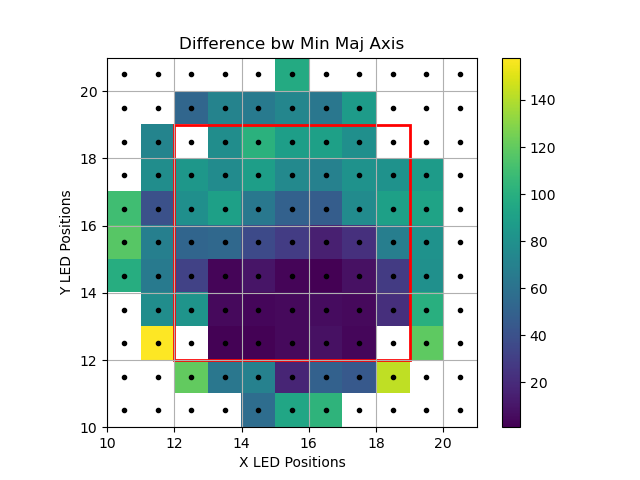

In [23]:
plt.figure()
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])

diff_axis = axis_lens_extended[:, :, 0] - axis_lens_extended[:, :, 1]

cp = plt.imshow(np.array([list(reversed(diff_axis[i, :])) for i in range(diff_axis.shape[0])]).T, 
                interpolation='none', extent=[10, 21, 10, 21]
                 )
# fig.colorbar(cp)
plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Difference bw Min Maj Axis")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')
# plt.tight_layout()

someX, someY = 12, 12
currentAxis = plt.gca()
currentAxis.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

plt.colorbar(cp)
plt.show()

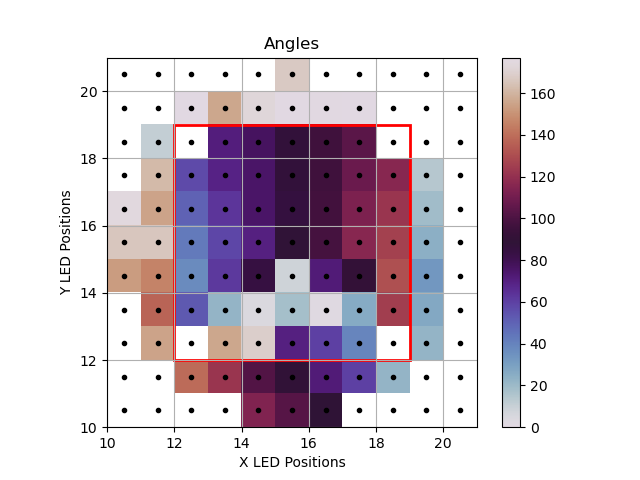

In [24]:
plt.figure()
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
cp = plt.imshow(np.array([list(reversed(angles_extended[i, :])) for i in range(angles_extended.shape[0])]).T,
                 interpolation='none', extent=[10, 21, 10, 21], 
                 cmap='twilight'
                 )
# fig.colorbar(cp)
plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Angles")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')
# plt.tight_layout()

someX, someY = 12, 12
currentAxis = plt.gca()
currentAxis.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

fig.colorbar(cp)
plt.show()

In [11]:
xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])

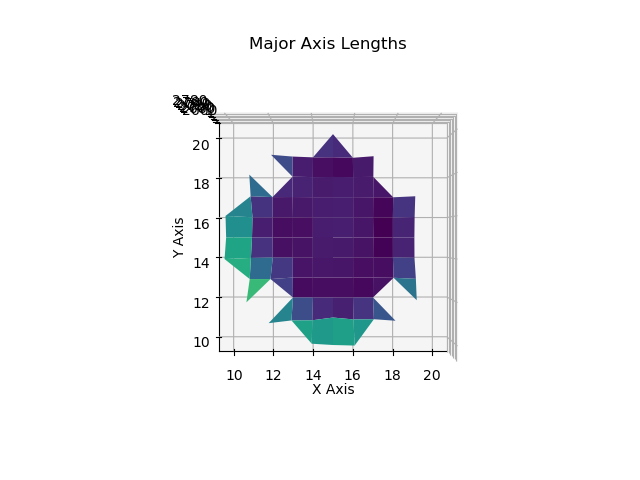

In [25]:
fig = plt.figure()
ax = plt.axes(projection='3d')

ax.plot_surface(yy, xx, axis_lens_extended[:, :, 0], rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('Major Axis Lengths');
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis');
ax.view_init(90, -91)

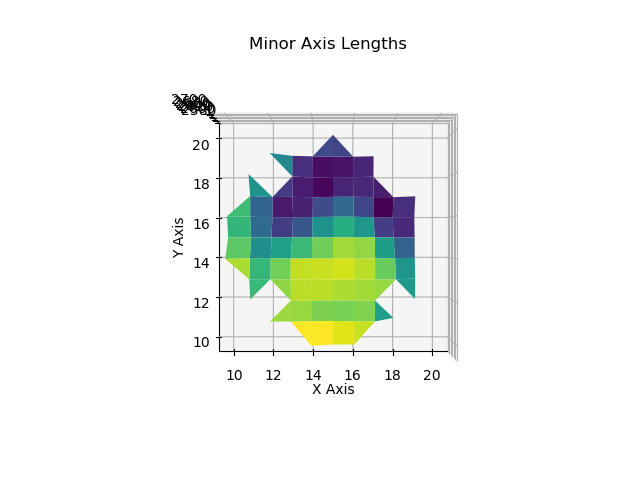

In [26]:
fig = plt.figure()
ax = plt.axes(projection='3d')

ax.plot_surface(yy, xx, axis_lens_extended[:, :, 1], rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('Minor Axis Lengths');
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis');
ax.view_init(90, -91)

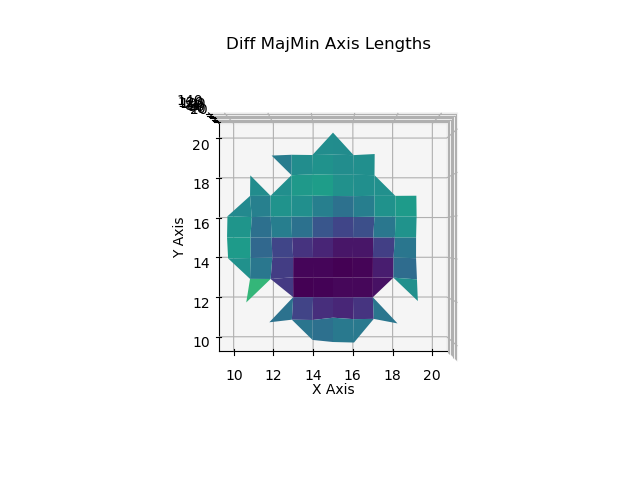

In [27]:
fig = plt.figure()
ax = plt.axes(projection='3d')

ax.plot_surface(yy, xx, axis_lens_extended[:, :, 0] - axis_lens_extended[:, :, 1], rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('Diff MajMin Axis Lengths');
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis');
ax.view_init(90, -91)

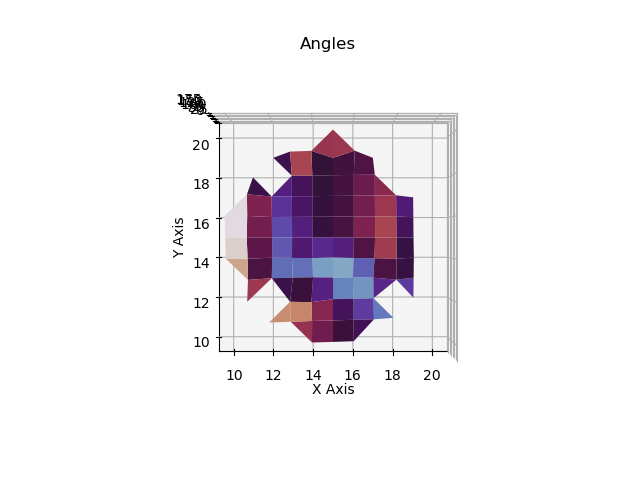

In [28]:

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.plot_surface(yy, xx, angles_extended, rstride=1, cstride=1,
                cmap='twilight', edgecolor='none')
ax.set_title('Angles');
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis');
ax.view_init(90, -91)

## FITTING

In [29]:
from sklearn.linear_model import Ridge, Lasso
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

In [30]:
z_ax0 = np.delete(axis_lens[:, :, 0].reshape(-1, 1), [0, 6, -7, -1], 0) # min
z_ax1 = np.delete(axis_lens[:, :, 1].reshape(-1, 1), [0, 6, -7, -1], 0) # maj
z_angles = np.delete(angles_saved[:, :].reshape(-1, 1), [0, 6, -7, -1], 0)
y1, x1 = np.meshgrid([i for i in range(12, 19)], [i for i in range(12, 19)])
x1 = np.delete(x1[:, :].reshape(-1, 1), [0, 6, -7, -1], 0)
y1 = np.delete(y1[:, :].reshape(-1, 1), [0, 6, -7, -1], 0)

In [31]:
# additional features with degree 2
x2 = x1**2
y2 = y1**2
xy = x1*y1
x3 = x1**3
y3 = y1**3

X = np.array([x1, y1, x2, y2, xy, x3, y3]).squeeze().T

print(X.shape)

(45, 7)


In [32]:
# define model
model_ax0 = Ridge(alpha=0.5, solver='lsqr')
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_ax0, X, z_ax0, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

model_ax0.fit(X, z_ax0)

w_z_ax0 = model_ax0.coef_
print(w_z_ax0, model_ax0.intercept_)

Mean MAE: 14.149 (4.644)
[[ 0.18209488  0.03107323  2.88452691 -0.03847153 -0.02654681 -0.12702866
  -0.02022648]] [2499.64063531]


In [33]:
# define model
model_ax1 = Ridge(alpha=0.5, solver='lsqr')
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_ax1, X[:, :-2], z_ax1, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

model_ax1.fit(X[:, :-2], z_ax1)

w_z_ax1 = model_ax1.coef_
print(w_z_ax1, model_ax1.intercept_)

Mean MAE: 6.209 (4.404)
[[-6.83235681 -4.38549775  0.02671118  0.02110941  0.28043923]] [2765.55044151]


In [34]:
y1, x1 = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])
x1 = x1.reshape(-1, 1)
y1 = y1.reshape(-1, 1)
x2 = x1**2
y2 = y1**2
xy = x1*y1
x3 = x1**3
y3 = y1**3
predX = np.array([x1, y1, x2, y2, xy, x3, y3]).squeeze().T

est_z_ax0 = model_ax0.predict(predX)
est_z_ax0 = est_z_ax0.reshape(11, 11)

est_z_ax1 = model_ax1.predict(predX[:, :-2])
est_z_ax1 = est_z_ax1.reshape(11, 11)

C:\Users\Kazim\AppData\Local\Temp\ipykernel_18664\3696721678.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 2, figsize=(12, 7), layout='tight')


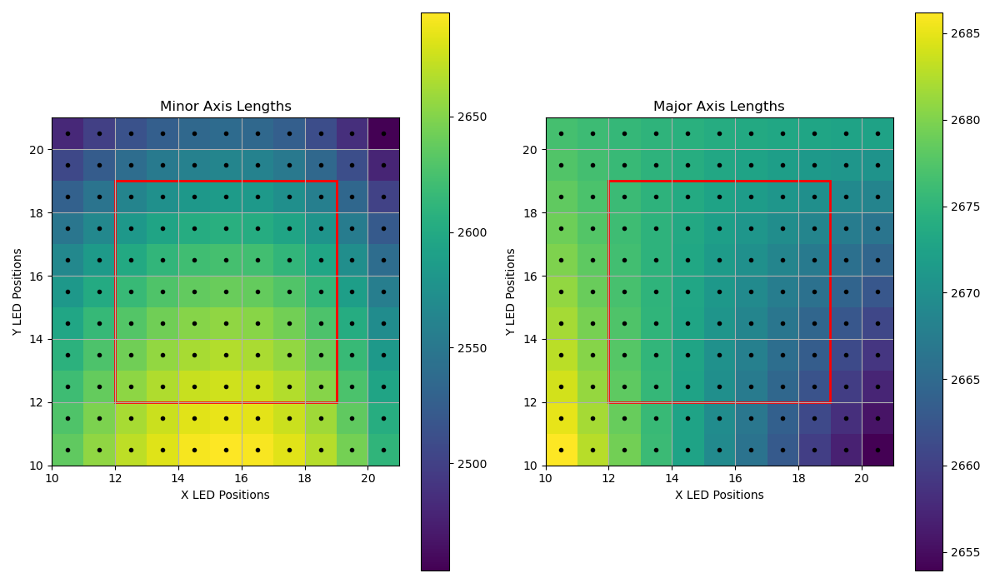

In [45]:
fig, ax = plt.subplots(1, 2, figsize=(12, 7), layout='tight')

xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])

cp = ax[0].imshow(np.array([list(reversed(est_z_ax0[i, :])) for i in range(est_z_ax0.shape[0])]).T, interpolation='none',
                  extent=[10, 21, 10, 21]
                 )

ax[0].grid()
ax[0].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[0].set_title("Minor Axis Lengths")
ax[0].set_xlabel('X LED Positions')
ax[0].set_ylabel('Y LED Positions')

someX, someY = 12, 12
ax[0].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

fig.colorbar(cp)

cp = ax[1].imshow(np.array([list(reversed(est_z_ax1[i, :])) for i in range(est_z_ax1.shape[0])]).T, interpolation='none',
                  extent=[10, 21, 10, 21]
                 )

ax[1].grid()
ax[1].scatter(xx+0.5, yy+0.5, marker=".", color="black")
ax[1].set_title("Major Axis Lengths")
ax[1].set_xlabel('X LED Positions')
ax[1].set_ylabel('Y LED Positions')

someX, someY = 12, 12
ax[1].add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

fig.colorbar(cp);

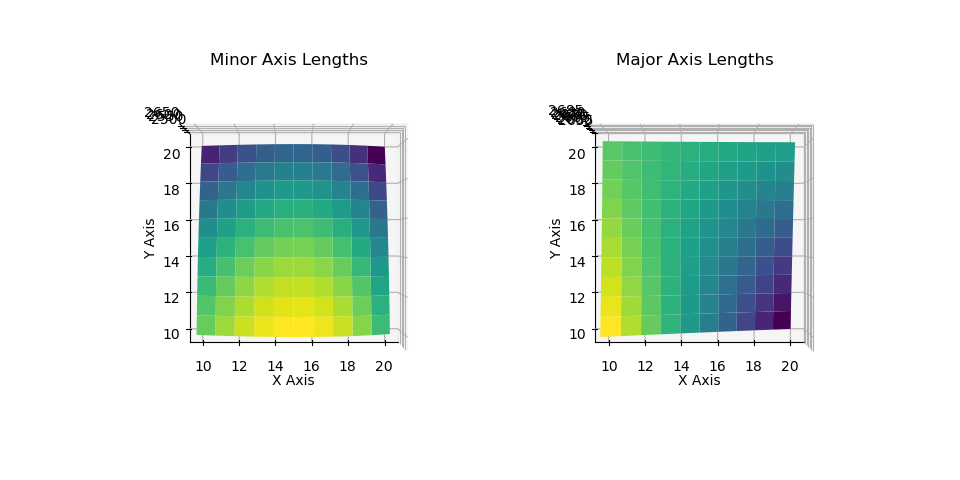

In [36]:
fig = plt.figure(figsize=plt.figaspect(0.5))

ax = fig.add_subplot(1, 2, 1, projection='3d')

ax.plot_surface(yy, xx, est_z_ax0, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('Minor Axis Lengths');
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis');
ax.view_init(90, -91)

ax = fig.add_subplot(1, 2, 2, projection='3d')
ax.plot_surface(yy, xx, est_z_ax1, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
ax.set_title('Major Axis Lengths');
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis');
ax.view_init(90, -91)

In [37]:
y1, x1 = np.meshgrid([i for i in range(12, 19)], [i for i in range(12, 19)])

angles_saved_copy = angles_saved.copy()
angles_saved_copy[np.where(diff_axis[2:9, 2:9] <= 15)] = np.nan

In [38]:
x1 = np.delete(x1.reshape(-1), np.argwhere(np.isnan(angles_saved_copy.reshape(-1))).reshape(-1))
y1 = np.delete(y1.reshape(-1), np.argwhere(np.isnan(angles_saved_copy.reshape(-1))).reshape(-1))
angles_saved_copy = np.delete(angles_saved_copy.reshape(-1), np.argwhere(np.isnan(angles_saved_copy.reshape(-1))).reshape(-1))
x1, y1, angles_saved_copy

(array([12, 12, 12, 12, 12, 13, 13, 13, 13, 14, 14, 14, 14, 15, 15, 15, 15,
        16, 16, 16, 17, 17, 17, 17, 18, 18, 18, 18, 18]),
 array([13, 14, 15, 16, 17, 15, 16, 17, 18, 15, 16, 17, 18, 15, 16, 17, 18,
        16, 17, 18, 15, 16, 17, 18, 13, 14, 15, 16, 17]),
 array([ 53.,  37.,  43.,  50.,  57.,  58.,  63.,  69.,  71.,  70.,  75.,
         75.,  77.,  88.,  85.,  87.,  87.,  97.,  96.,  96., 116., 113.,
        108., 104., 125., 131., 126., 122., 116.]))

In [39]:
# additional features with degree 2
x2 = x1**2
y2 = y1**2
xy = x1*y1
x3 = x1**3
y3 = y1**3

X = np.array([x1, y1, x2, y2, xy, x3, y3]).squeeze().T

print(X.shape)

(29, 7)


In [40]:
# define model
model_ang = Ridge(alpha=0.5, solver='lsqr')
# define model evaluation method
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
# evaluate model
scores = cross_val_score(model_ang, X[:, :-2], angles_saved_copy, scoring='neg_mean_absolute_error', cv=cv, n_jobs=-1)
# force scores to be positive
scores = np.absolute(scores)
print('Mean MAE: %.3f (%.3f)' % (np.mean(scores), np.std(scores)))

model_ang.fit(X[:, :-2], angles_saved_copy)

w_z_ang = model_ang.coef_
print(w_z_ang, model_ang.intercept_)

Mean MAE: 3.634 (1.762)
[ 9.42944697  1.31815639  0.47404313  0.33433636 -0.74189097] -93.08141194626909


In [42]:
est_z_ang = model_ang.predict(predX[:, :-2])
est_z_ang = est_z_ang.reshape(11, 11)

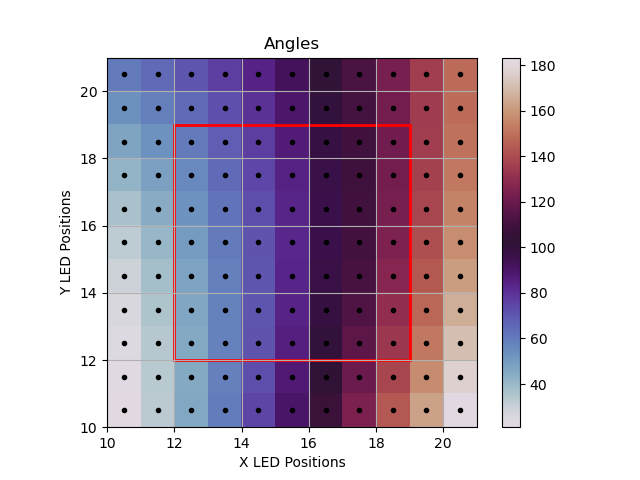

In [46]:
fig = plt.figure()

xx, yy = np.meshgrid([i for i in range(10, 21)], [i for i in range(10, 21)])

cp = plt.imshow(np.array([list(reversed(est_z_ang[i, :])) for i in range(est_z_ang.shape[0])]).T, interpolation='none',
                  extent=[10, 21, 10, 21], cmap='twilight'
                 )

plt.grid()
plt.scatter(xx+0.5, yy+0.5, marker=".", color="black")
plt.title("Angles")
plt.xlabel('X LED Positions')
plt.ylabel('Y LED Positions')

someX, someY = 12, 12
ax = plt.gca()
ax.add_patch(Rectangle((someX, someY), 7, 7, facecolor="none", ec='red', lw=2))

fig.colorbar(cp)

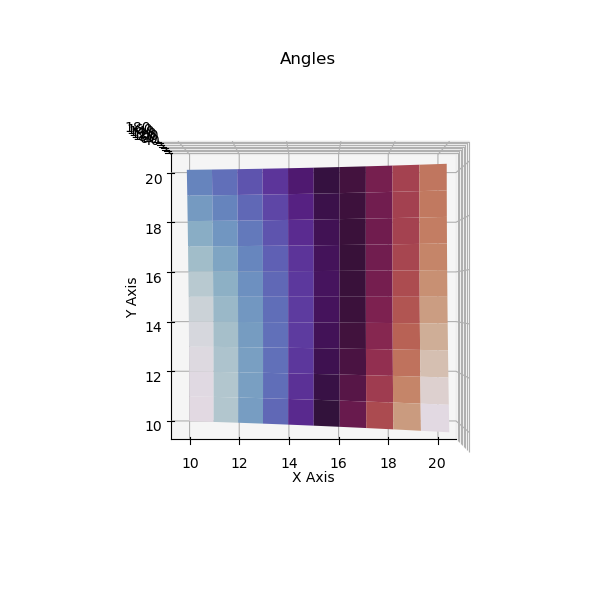

In [44]:
fig = plt.figure(figsize=(6, 6))
ax = plt.axes(projection='3d')

ax.plot_surface(yy, xx, est_z_ang, rstride=1, cstride=1,
                cmap='twilight', edgecolor='none')
ax.set_title('Angles');
ax.set_xlabel('X Axis')
ax.set_ylabel('Y Axis');
ax.view_init(90, -91)

In [31]:
## save into manual and extrap suffix txts

# np.savetxt('extrap_280923/axis_lens_entended_manual.txt', axis_lens_extended.reshape(-1, 2))
# np.savetxt('extrap_280923/angles_extended_manual.txt', angles_extended.reshape(-1))
# np.savetxt('extrap_280923/axis_lens_entended_extrap.txt', np.array([est_z_ax0, est_z_ax1]).T.reshape(-1, 2))
# np.savetxt('extrap_280923/angles_extended_extrap.txt', est_z_ang.reshape(-1))

In [32]:
np.array([est_z_ax0, est_z_ax1]).T.shape

(11, 11, 2)

## Use Exrapolated Centers, Axis Lengths, and Angles to Plot ELlipse on the Image Grid

In [33]:
%matplotlib inline
%matplotlib inline

<Figure size 640x480 with 0 Axes>

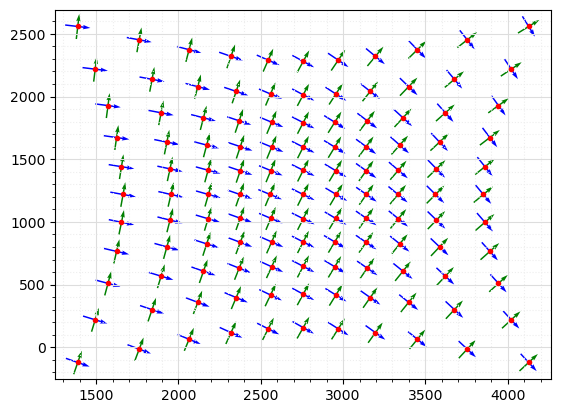

In [35]:
plt.figure()
extrap_centers = np.loadtxt('extrap_280923/center_cords_extended_extrap.txt').reshape(11, 11, 2)
extrap_axis_lens = np.loadtxt('extrap_280923/axis_lens_entended_extrap.txt').reshape(11, 11, 2)
extrap_angles = np.loadtxt('extrap_280923/angles_extended_extrap.txt').reshape(11, 11)

extrap_centers_0 = np.array([list(reversed(extrap_centers[i, :])) for i in range(extrap_centers.shape[0])])[:, :, 0].T
extrap_centers_1 = np.array([list(reversed(extrap_centers[i, :])) for i in range(extrap_centers.shape[0])])[:, :, 1].T
extrap_axis_lens_0 = np.array([list(reversed(extrap_axis_lens[i, :])) for i in range(extrap_axis_lens.shape[0])])[:, :, 0].T
extrap_axis_lens_1 = np.array([list(reversed(extrap_axis_lens[i, :])) for i in range(extrap_axis_lens.shape[0])])[:, :, 1].T
extrap_angles = np.array([list(reversed(extrap_angles[i, :])) for i in range(extrap_angles.shape[0])]).T

fig, ax = plt.subplots()

q = ax.quiver(extrap_centers_0, extrap_centers_1, 
              extrap_axis_lens_0*np.cos(-extrap_angles/180), extrap_axis_lens_0*np.sin(-extrap_angles/180), 
              pivot='mid', width=0.003, color='b')
ax.quiverkey(q, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')

r = ax.quiver(extrap_centers_0, extrap_centers_1, 
              extrap_axis_lens_1*np.cos(-extrap_angles/180 + np.pi/2), extrap_axis_lens_1*np.sin(-extrap_angles/180 + np.pi/2), 
              pivot='mid', width=0.003, color='g')
ax.quiverkey(r, X=0.3, Y=1.1, U=10,
             label='Quiver key, length = 10', labelpos='E')


ax.plot(extrap_centers_0, extrap_centers_1, 'r.')

ax.grid(which='major', color='#DDDDDD', linewidth=0.8)
ax.grid(which='minor', color='#EEEEEE', linestyle=':', linewidth=0.8)
ax.minorticks_on()

In [39]:
extrap_centers[:, :, 1].shape, np.zeros([11, 11]).shape, extrap_axis_lens[:, :, 0].shape

((11, 11), (11, 11), (11, 11))

In [40]:
def draw_cross(img, cord, color, length=50, thickness=10):
    
    x, y = int(cord[0]), int(cord[1])
    cv2.line(img, (x-length, y-length), (x+length, y+length), color, thickness)
    cv2.line(img, (x+length, y-length), (x-length, y+length), color, thickness)
    
    return img

x: 10 y: 10 2023_03_15_16_02_07_img_shutter_05_x_10_y_10_r_0_g_1_b_0.tiff
x:10, y:10, Center:(1388.5839632299887, 2558.633798983109), Axis:(2636.4680409575767, 2686.197877787367), Angle:21.043473013842274


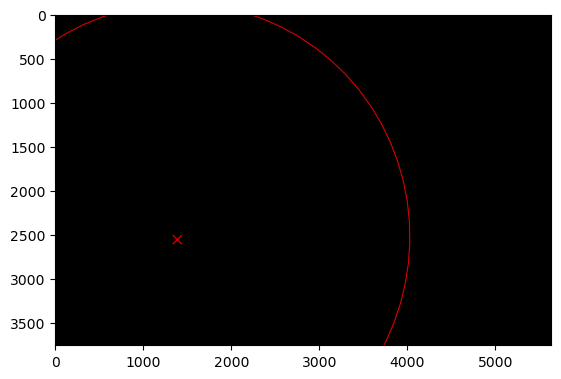

x: 10 y: 11 2023_03_15_16_02_07_img_shutter_05_x_10_y_11_r_0_g_1_b_0.tiff
x:10, y:11, Center:(1494.482661439307, 2218.2381539222356), Axis:(2654.9132474697617, 2682.730848011993), Angle:21.96378314589346


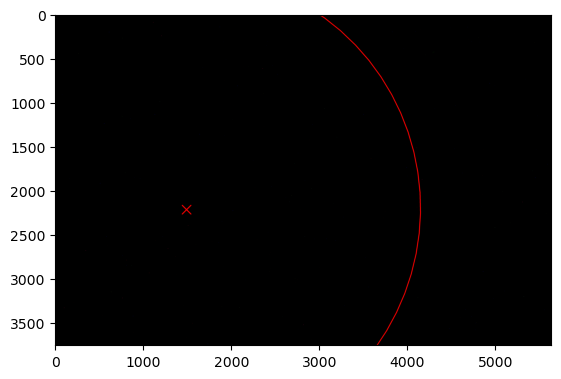

x: 10 y: 12 2023_03_15_16_02_07_img_shutter_05_x_10_y_12_r_0_g_1_b_0.tiff
x:10, y:12, Center:(1572.1352181830994, 1927.8628089859549), Axis:(2670.743616467628, 2679.3172405899977), Angle:23.55276599098997


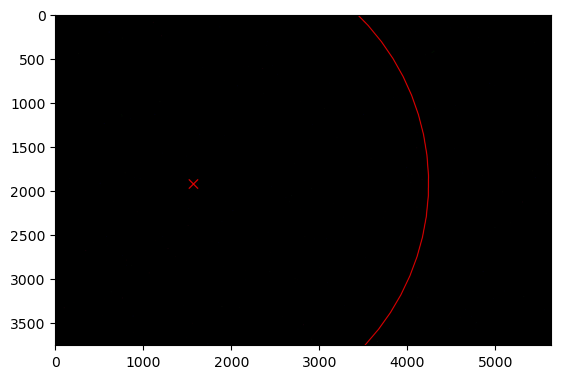

x: 10 y: 13 2023_03_15_16_02_07_img_shutter_05_x_10_y_13_r_0_g_1_b_0.tiff
x:10, y:13, Center:(1624.3765800054628, 1673.0371105366182), Axis:(2683.196976012325, 2675.95705552138), Angle:25.810421549131817


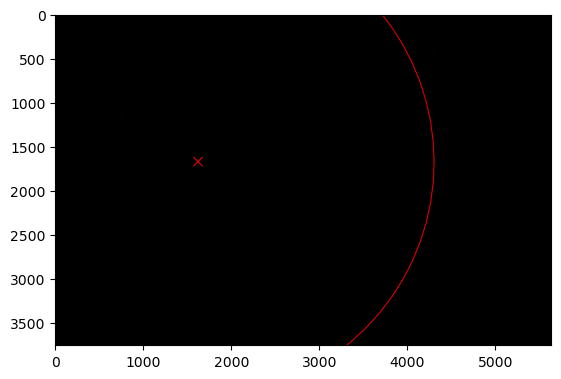

x: 10 y: 14 2023_03_15_16_02_07_img_shutter_05_x_10_y_14_r_0_g_1_b_0.tiff
x:10, y:14, Center:(1654.1429166684843, 1440.6477717284338), Axis:(2691.5111541650053, 2672.65029280614), Angle:28.73674982031899


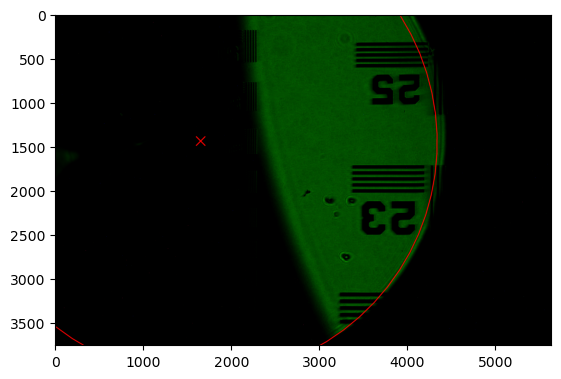

x: 10 y: 15 2023_03_15_16_02_07_img_shutter_05_x_10_y_15_r_0_g_1_b_0.tiff
x:10, y:15, Center:(1663.7639391569749, 1219.0), Axis:(2694.92397898682, 2669.396952444278), Angle:32.331750804551504


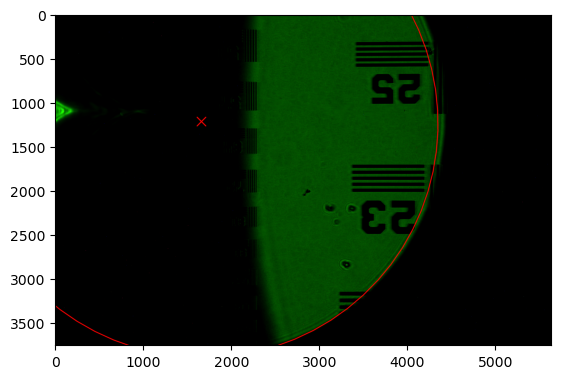

x: 10 y: 16 2023_03_15_16_02_07_img_shutter_05_x_10_y_16_r_0_g_1_b_0.tiff
x:10, y:16, Center:(1654.1429166684843, 997.3522282715662), Axis:(2692.6732785389204, 2666.197034435794), Angle:36.595424501829356


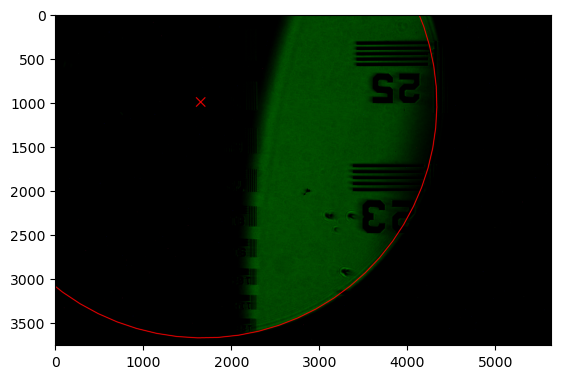

x: 10 y: 17 2023_03_15_16_02_07_img_shutter_05_x_10_y_17_r_0_g_1_b_0.tiff
x:10, y:17, Center:(1624.3765800054628, 764.9628894633818), Axis:(2683.996880882457, 2663.0505387806884), Angle:41.52777091215249


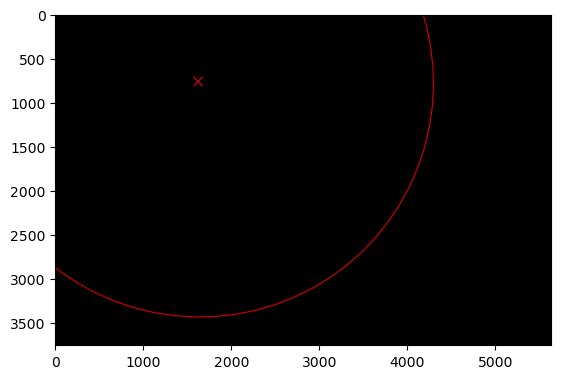

x: 10 y: 18 2023_03_15_16_02_07_img_shutter_05_x_10_y_18_r_0_g_1_b_0.tiff
x:10, y:18, Center:(1572.1352181830994, 510.13719101404513), Axis:(2668.1326140785823, 2659.9574654789603), Angle:47.128790035520964


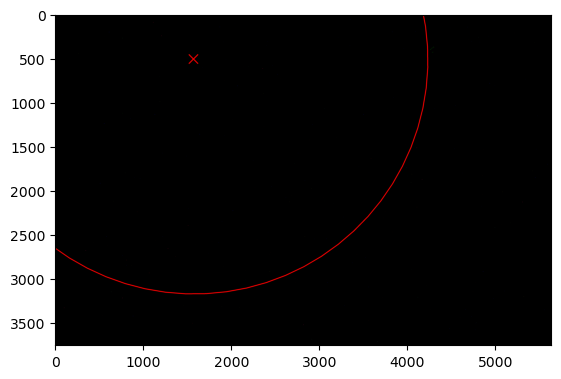

x: 10 y: 19 2023_03_15_16_02_07_img_shutter_05_x_10_y_19_r_0_g_1_b_0.tiff
x:10, y:19, Center:(1494.482661439307, 219.7618460777643), Axis:(2644.318306188446, 2656.9178145306105), Angle:53.398481871934806


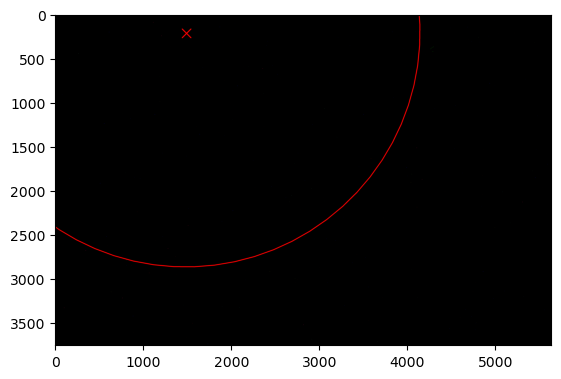

x: 10 y: 20 2023_03_15_16_02_07_img_shutter_05_x_10_y_20_r_0_g_1_b_0.tiff
x:10, y:20, Center:(1388.5839632299887, -120.63379898310905), Axis:(2611.7917852732007, 2653.9315859356384), Angle:60.33684642139396


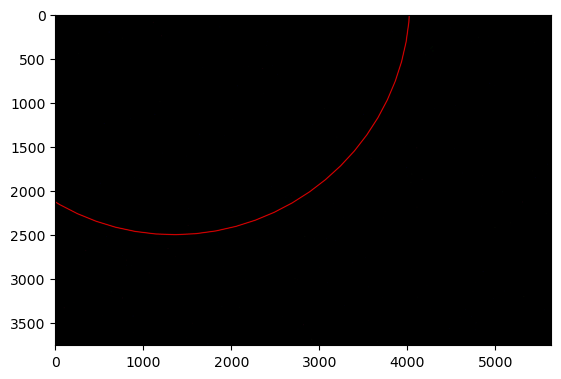

x: 11 y: 10 2023_03_15_16_02_07_img_shutter_05_x_11_y_10_r_0_g_1_b_0.tiff
x:11, y:10, Center:(1761.8460892609487, 2452.2019908219063), Axis:(2628.7307804918796, 2685.06006996801), Angle:33.00891600083658


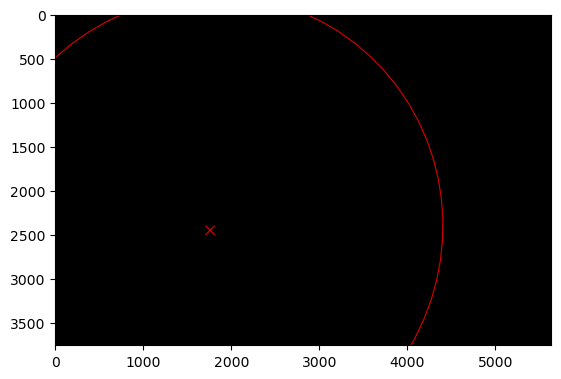

x: 11 y: 11 2023_03_15_16_02_07_img_shutter_05_x_11_y_11_r_0_g_1_b_0.tiff
x:11, y:11, Center:(1839.7711645994632, 2137.195452342451), Axis:(2647.1494401924547, 2681.873479425485), Angle:33.18733515842973


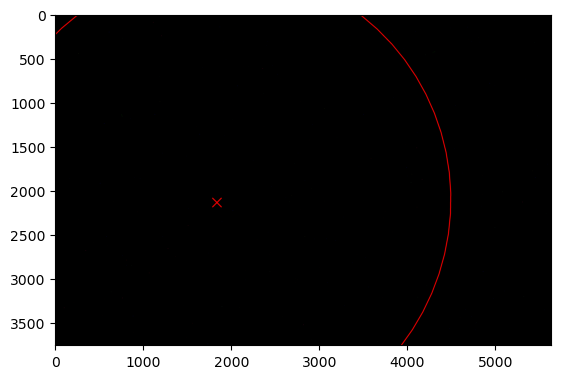

x: 11 y: 12 2023_03_15_16_02_07_img_shutter_05_x_11_y_12_r_0_g_1_b_0.tiff
x:11, y:12, Center:(1894.7625198888318, 1870.3103867510222), Axis:(2662.95326237871, 2678.740311236338), Angle:34.034427029068226


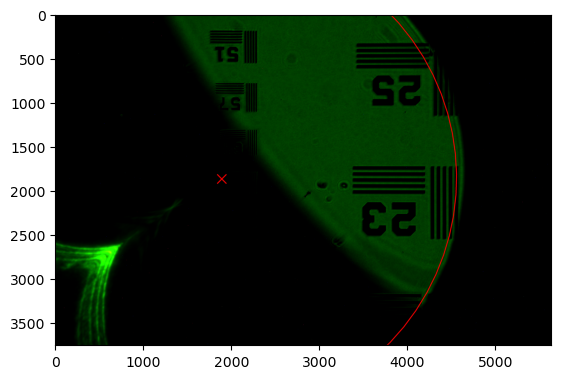

x: 11 y: 13 2023_03_15_16_02_07_img_shutter_05_x_11_y_13_r_0_g_1_b_0.tiff
x:11, y:13, Center:(1929.8690602520708, 1636.6877926202976), Axis:(2675.380075111797, 2675.66056540057), Angle:35.55019161275207


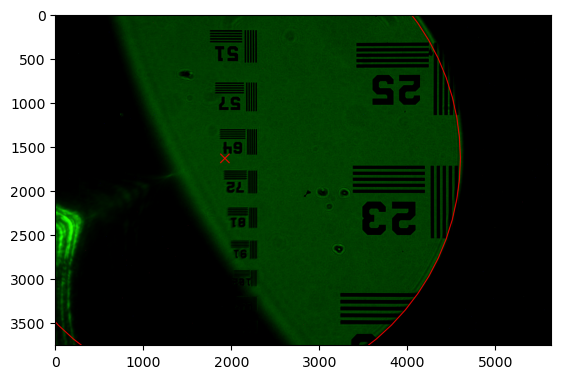

x: 11 y: 14 2023_03_15_16_02_07_img_shutter_05_x_11_y_14_r_0_g_1_b_0.tiff
x:11, y:14, Center:(1948.7152917890312, 1423.222966277605), Axis:(2683.6677064528667, 2672.6342419181788), Angle:37.73462890948123


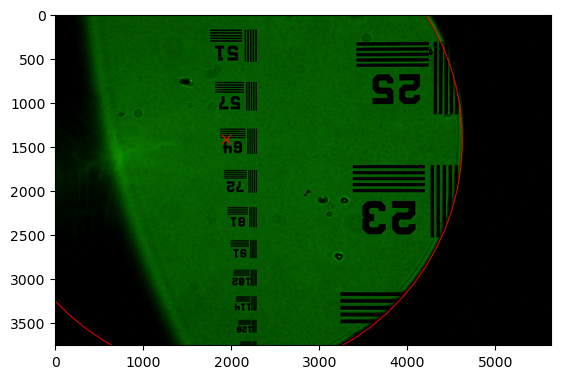

x: 11 y: 15 2023_03_15_16_02_07_img_shutter_05_x_11_y_15_r_0_g_1_b_0.tiff
x:11, y:15, Center:(1954.5465802934345, 1219.0), Axis:(2687.053984463071, 2669.661340789166), Angle:40.5877389192557


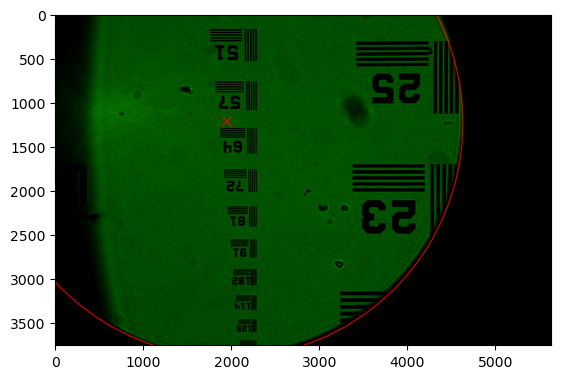

x: 11 y: 16 2023_03_15_16_02_07_img_shutter_05_x_11_y_16_r_0_g_1_b_0.tiff
x:11, y:16, Center:(1948.7152917890312, 1014.7770337223949), Axis:(2684.776737203561, 2666.7418620135313), Angle:44.109521642075535


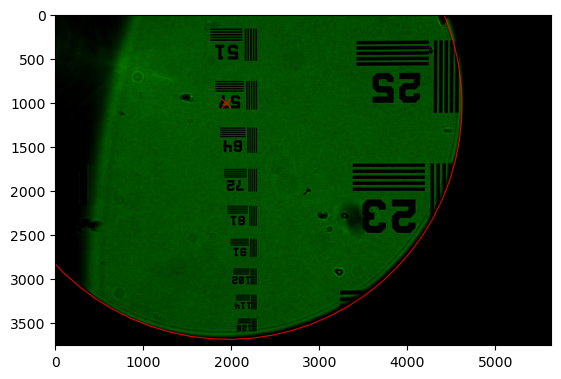

x: 11 y: 17 2023_03_15_16_02_07_img_shutter_05_x_11_y_17_r_0_g_1_b_0.tiff
x:11, y:17, Center:(1929.8690602520708, 801.3122073797024), Axis:(2676.073792735487, 2663.8758055912745), Angle:48.29997707794065


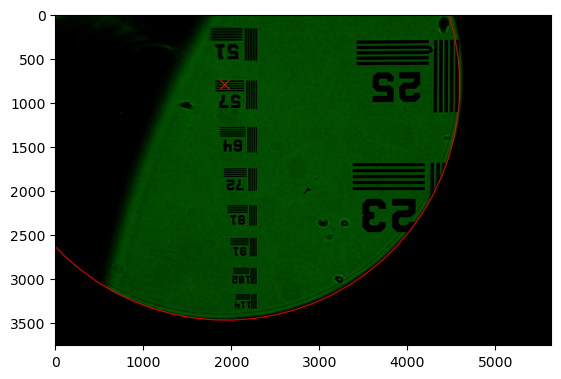

x: 11 y: 18 2023_03_15_16_02_07_img_shutter_05_x_11_y_18_r_0_g_1_b_0.tiff
x:11, y:18, Center:(1894.7625198888318, 567.6896132489779), Axis:(2660.1829791200016, 2661.0631715223954), Angle:53.15910522685111


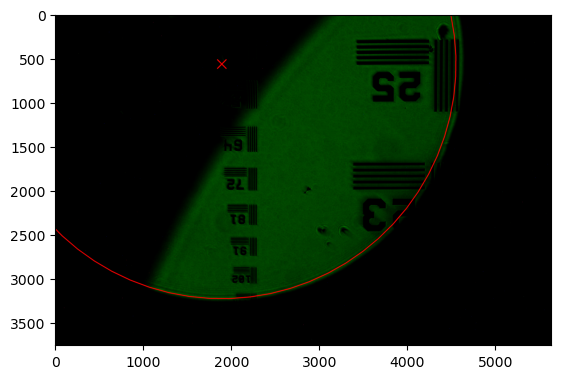

x: 11 y: 19 2023_03_15_16_02_07_img_shutter_05_x_11_y_19_r_0_g_1_b_0.tiff
x:11, y:19, Center:(1839.7711645994632, 300.8045476575487), Axis:(2636.3421244182555, 2658.3039598068945), Angle:58.686906088806936


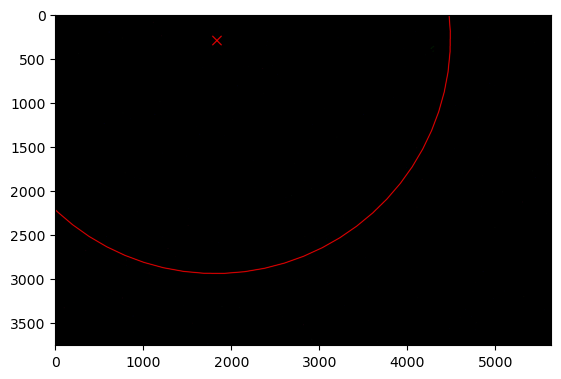

x: 11 y: 20 2023_03_15_16_02_07_img_shutter_05_x_11_y_20_r_0_g_1_b_0.tiff
x:11, y:20, Center:(1761.8460892609487, -14.201990821906293), Axis:(2603.7890566913993, 2655.5981704447718), Angle:64.88337966380807


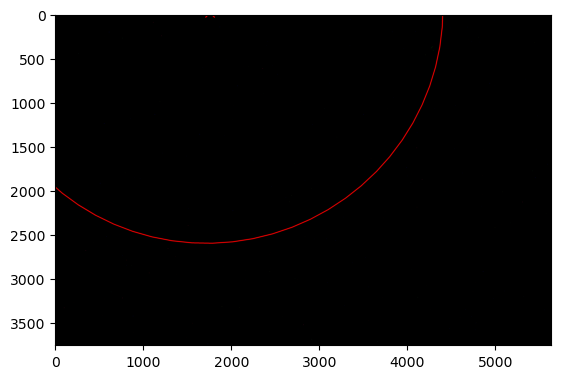

x: 12 y: 10 2023_03_15_16_02_07_img_shutter_05_x_12_y_10_r_0_g_1_b_0.tiff
x:12, y:10, Center:(2064.7033801263965, 2373.600825103962), Axis:(2619.5816295618706, 2683.9644809677798), Angle:45.922445250715455


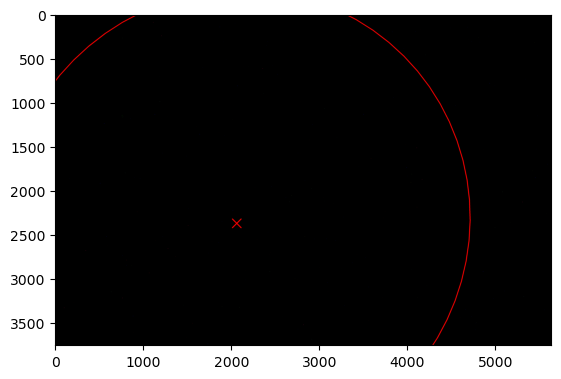

x: 12 y: 11 2023_03_15_16_02_07_img_shutter_05_x_12_y_11_r_0_g_1_b_0.tiff
x:12, y:11, Center:(2117.4690535547843, 2078.886462109216), Axis:(2637.9737424508353, 2681.058329658104), Angle:45.35897343385061


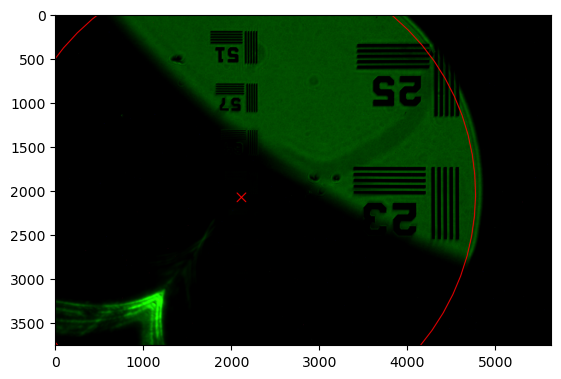

x: 12 y: 12 2023_03_15_16_02_07_img_shutter_05_x_12_y_12_r_0_g_1_b_0.tiff
x:12, y:12, Center:(2152.173926897735, 1830.527252574032), Axis:(2653.75101782548, 2678.2056007018064), Angle:45.4641743300311


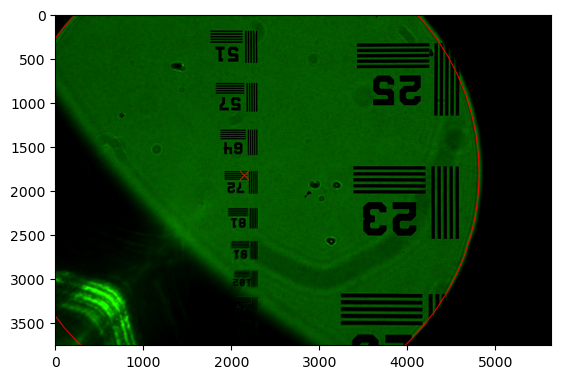

x: 12 y: 13 2023_03_15_16_02_07_img_shutter_05_x_12_y_13_r_0_g_1_b_0.tiff
x:12, y:13, Center:(2171.6660910761293, 1612.918523295742), Axis:(2666.151283746957, 2675.406294098887), Angle:46.2380479392569


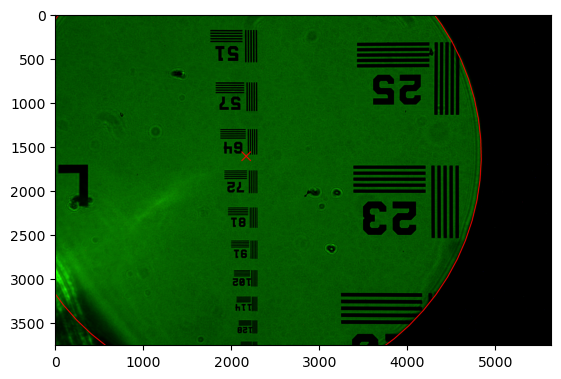

x: 12 y: 14 2023_03_15_16_02_07_img_shutter_05_x_12_y_14_r_0_g_1_b_0.tiff
x:12, y:14, Center:(2180.141539838916, 1412.4775110581206), Axis:(2674.4123682764166, 2672.660409849345), Angle:47.68059426152804


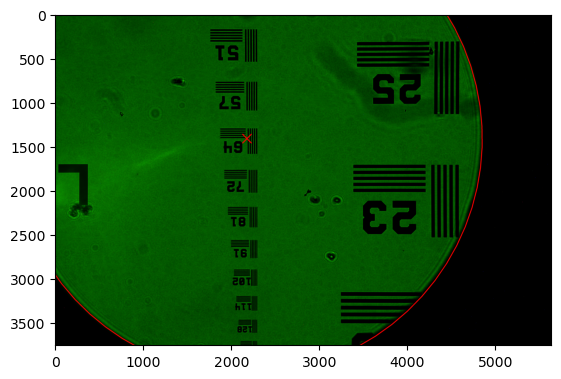

x: 12 y: 15 2023_03_15_16_02_07_img_shutter_05_x_12_y_15_r_0_g_1_b_0.tiff
x:12, y:15, Center:(2182.2314782197373, 1219.0), Axis:(2677.7720994750102, 2669.9679479531815), Angle:49.79181329684452


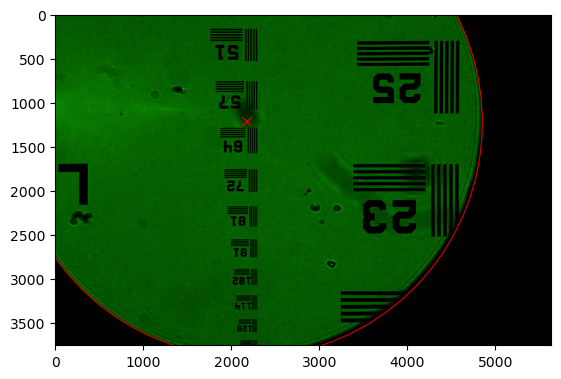

x: 12 y: 16 2023_03_15_16_02_07_img_shutter_05_x_12_y_16_r_0_g_1_b_0.tiff
x:12, y:16, Center:(2180.141539838916, 1025.5224889418794), Axis:(2675.4683054038896, 2667.3289084103953), Angle:52.571705045206315


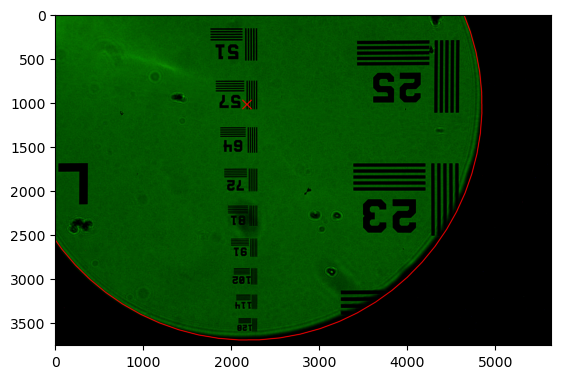

x: 12 y: 17 2023_03_15_16_02_07_img_shutter_05_x_12_y_17_r_0_g_1_b_0.tiff
x:12, y:17, Center:(2171.6660910761293, 825.0814767042579), Axis:(2666.7388141242054, 2664.743291220988), Angle:56.02026950661342


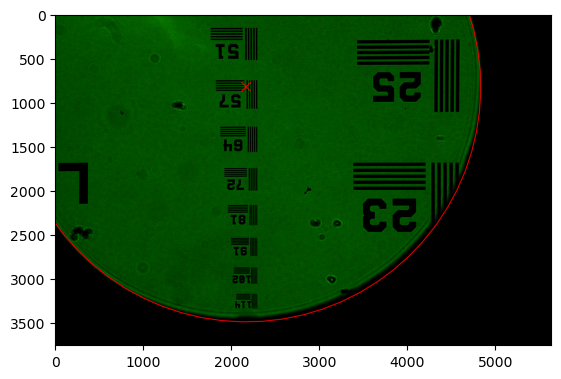

x: 12 y: 18 2023_03_15_16_02_07_img_shutter_05_x_12_y_18_r_0_g_1_b_0.tiff
x:12, y:18, Center:(2152.173926897735, 607.472747425968), Axis:(2650.8214536971095, 2662.2110963849577), Angle:60.13750668106586


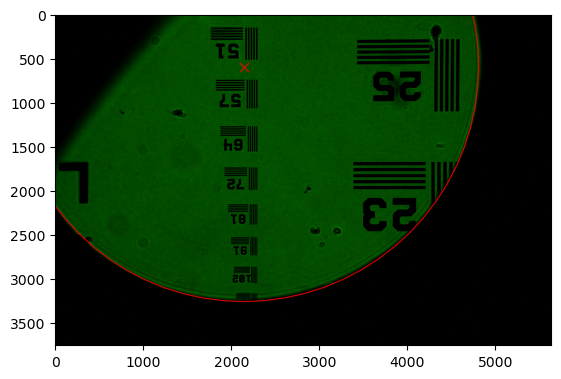

x: 12 y: 19 2023_03_15_16_02_07_img_shutter_05_x_12_y_19_r_0_g_1_b_0.tiff
x:12, y:19, Center:(2117.4690535547843, 359.1135378907836), Axis:(2626.9540521837525, 2659.732323902306), Angle:64.92341656856367


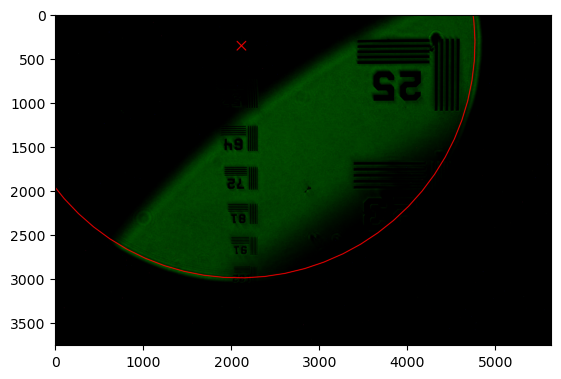

x: 12 y: 20 2023_03_15_16_02_07_img_shutter_05_x_12_y_20_r_0_g_1_b_0.tiff
x:12, y:20, Center:(2064.7033801263965, 64.39917489603795), Axis:(2594.374437645287, 2657.306973773032), Angle:70.37799916910679


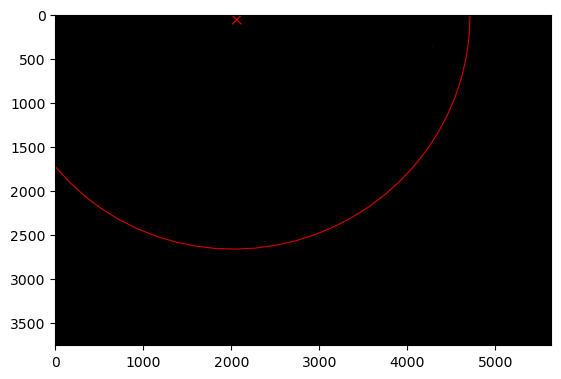

x: 13 y: 10 2023_03_15_16_02_07_img_shutter_05_x_13_y_10_r_0_g_1_b_0.tiff
x:13, y:10, Center:(2319.4195813241536, 2320.49269694551), Axis:(2608.8992293118345, 2682.911110786677), Angle:59.78406076347896


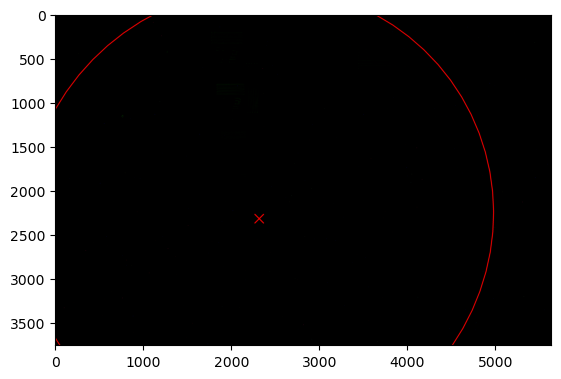

x: 13 y: 11 2023_03_15_16_02_07_img_shutter_05_x_13_y_11_r_0_g_1_b_0.tiff
x:13, y:11, Center:(2350.7963022730983, 2040.989985495978), Axis:(2627.2647953891887, 2680.2853987098506), Angle:58.4786979721561


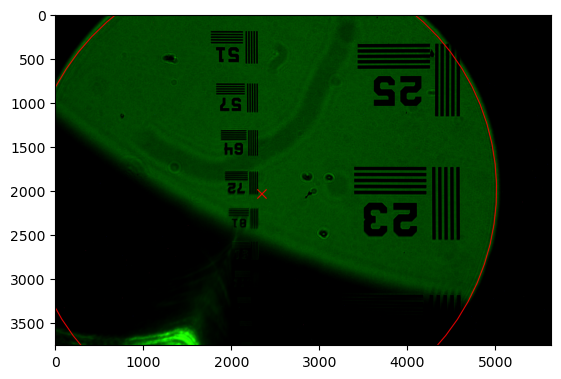

x: 13 y: 12 2023_03_15_16_02_07_img_shutter_05_x_13_y_12_r_0_g_1_b_0.tiff
x:13, y:12, Center:(2369.004430910626, 1806.5692465159727), Axis:(2643.0155239522232, 2677.713108986402), Angle:57.842007893878545


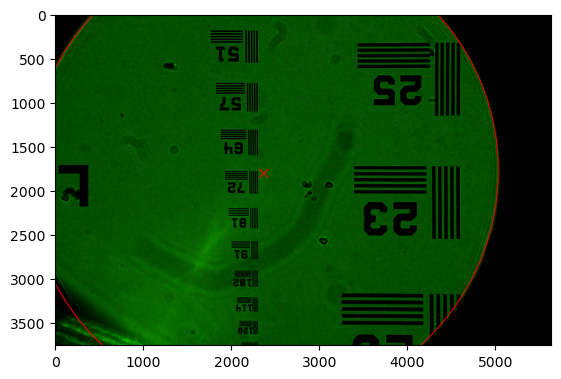

x: 13 y: 13 2023_03_15_16_02_07_img_shutter_05_x_13_y_13_r_0_g_1_b_0.tiff
x:13, y:13, Center:(2375.92469218827, 1600.6148462276306), Axis:(2655.3892430620895, 2675.194241616331), Angle:57.87399052864636


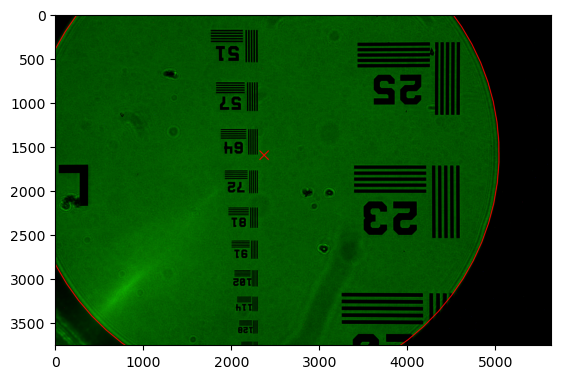

x: 13 y: 14 2023_03_15_16_02_07_img_shutter_05_x_13_y_14_r_0_g_1_b_0.tiff
x:13, y:14, Center:(2375.4467527641846, 1408.1760575773023), Axis:(2663.6237807799384, 2672.7287965996384), Angle:58.574645876459485


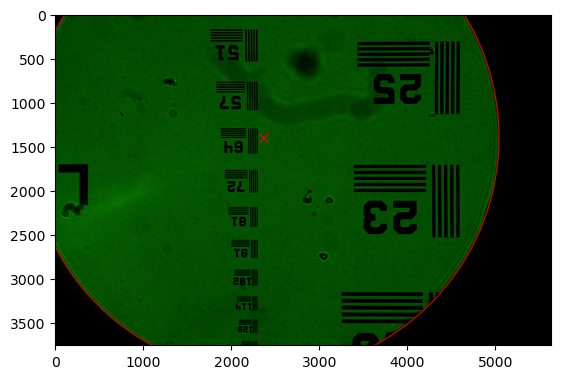

x: 13 y: 15 2023_03_15_16_02_07_img_shutter_05_x_13_y_15_r_0_g_1_b_0.tiff
x:13, y:15, Center:(2373.948661662113, 1219.0), Axis:(2666.9569651669217, 2670.316773936324), Angle:59.94397393731792


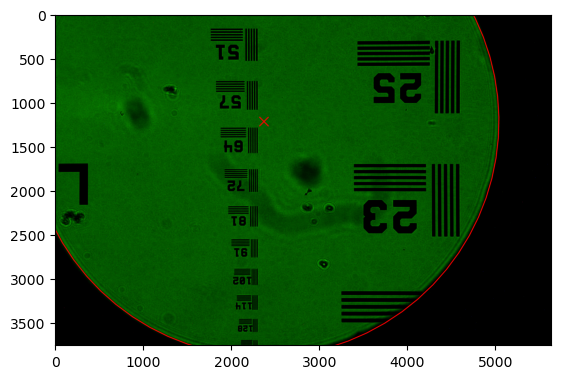

x: 13 y: 16 2023_03_15_16_02_07_img_shutter_05_x_13_y_16_r_0_g_1_b_0.tiff
x:13, y:16, Center:(2375.4467527641846, 1029.8239424226977), Axis:(2664.6266242841907, 2667.958173626387), Angle:61.981974711221696


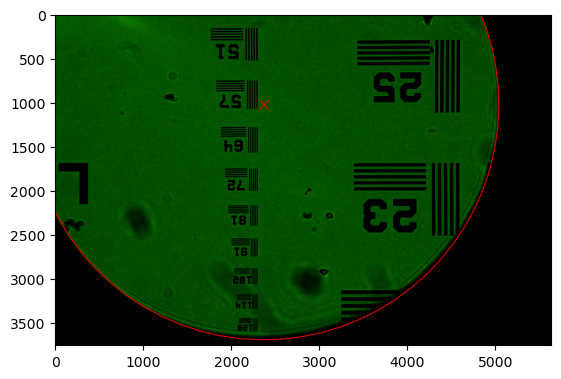

x: 13 y: 17 2023_03_15_16_02_07_img_shutter_05_x_13_y_17_r_0_g_1_b_0.tiff
x:13, y:17, Center:(2375.92469218827, 837.3851537723693), Axis:(2655.870586192896, 2665.652995669828), Angle:64.68864819817078


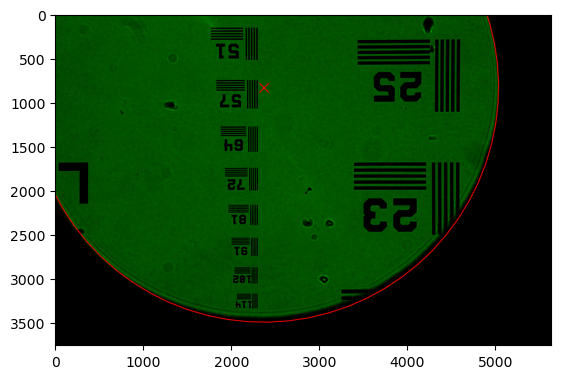

x: 13 y: 18 2023_03_15_16_02_07_img_shutter_05_x_13_y_18_r_0_g_1_b_0.tiff
x:13, y:18, Center:(2369.004430910626, 631.4307534840273), Axis:(2639.92667895419, 2663.4012400666475), Angle:68.0639943981652


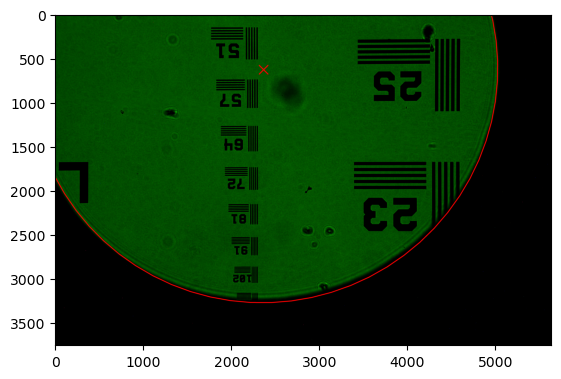

x: 13 y: 19 2023_03_15_16_02_07_img_shutter_05_x_13_y_19_r_0_g_1_b_0.tiff
x:13, y:19, Center:(2350.7963022730983, 397.0100145040219), Axis:(2616.032730629223, 2661.2029068168445), Angle:72.10801331120497


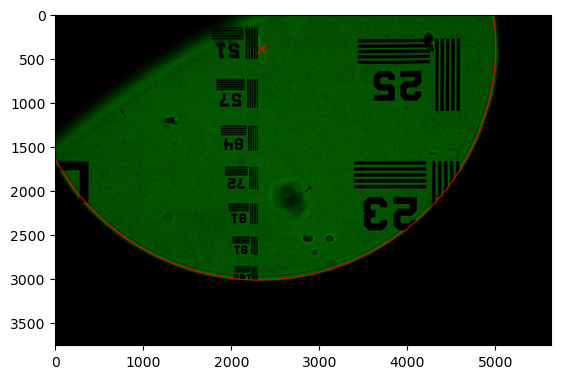

x: 13 y: 20 2023_03_15_16_02_07_img_shutter_05_x_13_y_20_r_0_g_1_b_0.tiff
x:13, y:20, Center:(2319.4195813241536, 117.5073030544902), Axis:(2583.426569279146, 2659.0579959204197), Angle:76.82070493729005


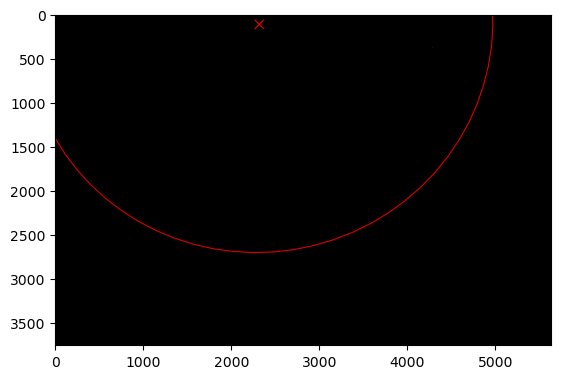

x: 14 y: 10 2023_03_15_16_02_07_img_shutter_05_x_14_y_10_r_0_g_1_b_0.tiff
x:14, y:10, Center:(2545.273044274948, 2290.2038010851197), Axis:(2596.562220886056, 2681.8999594247016), Angle:74.59376253912707


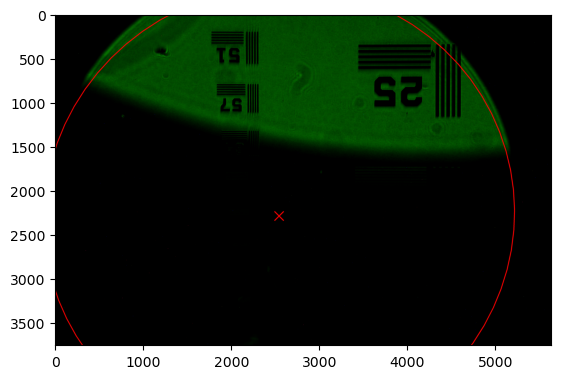

x: 14 y: 11 2023_03_15_16_02_07_img_shutter_05_x_14_y_11_r_0_g_1_b_0.tiff
x:14, y:11, Center:(2559.454613794136, 2020.3986010626604), Axis:(2614.9012401517994, 2679.554686580724), Angle:72.54650877334616


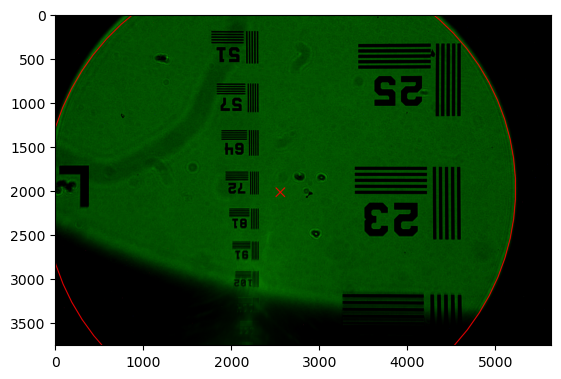

x: 14 y: 12 2023_03_15_16_02_07_img_shutter_05_x_14_y_12_r_0_g_1_b_0.tiff
x:14, y:12, Center:(2566.334482605448, 1795.1552035075852), Axis:(2630.6254219032235, 2677.2628360901244), Angle:71.16792772061062


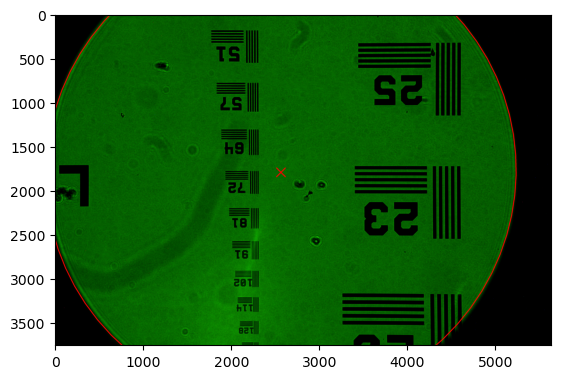

x: 14 y: 13 2023_03_15_16_02_07_img_shutter_05_x_14_y_13_r_0_g_1_b_0.tiff
x:14, y:13, Center:(2566.375011724362, 1597.1355972637948), Axis:(2642.9725942014793, 2675.024407952903), Angle:70.45801938092039


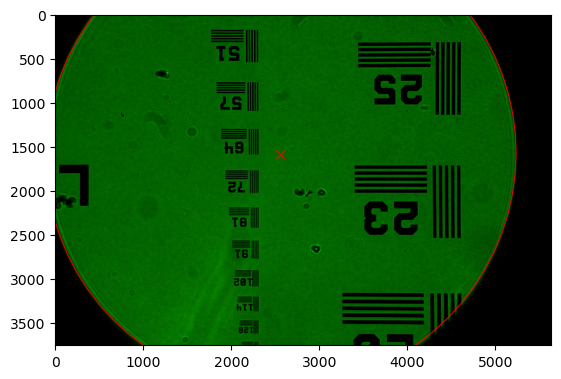

x: 14 y: 14 2023_03_15_16_02_07_img_shutter_05_x_14_y_14_r_0_g_1_b_0.tiff
x:14, y:14, Center:(2561.155902534536, 1409.4438798530268), Axis:(2651.180585107718, 2672.839402169059), Angle:70.41678375427547


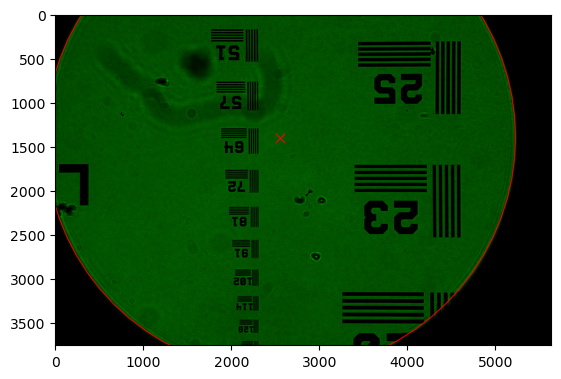

x: 14 y: 15 2023_03_15_16_02_07_img_shutter_05_x_14_y_15_r_0_g_1_b_0.tiff
x:14, y:15, Center:(2556.8281593467905, 1219.0), Axis:(2654.4872226830907, 2670.7078187385937), Angle:71.04422084067589


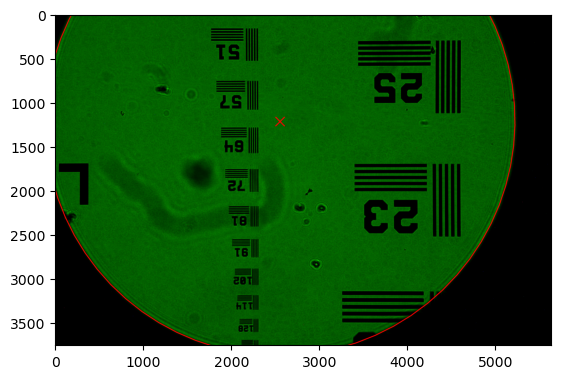

x: 14 y: 16 2023_03_15_16_02_07_img_shutter_05_x_14_y_16_r_0_g_1_b_0.tiff
x:14, y:16, Center:(2561.155902534536, 1028.5561201469732), Axis:(2652.1303349887494, 2668.629657661506), Angle:72.34033064012168


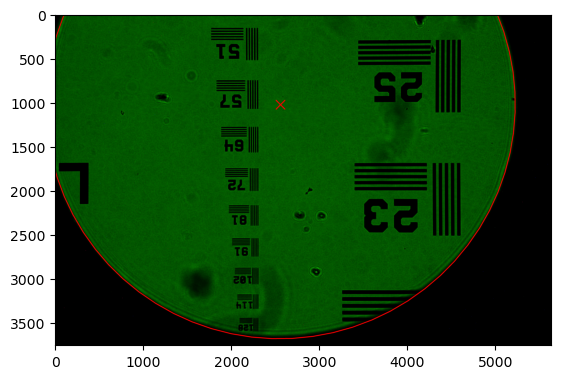

x: 14 y: 17 2023_03_15_16_02_07_img_shutter_05_x_14_y_17_r_0_g_1_b_0.tiff
x:14, y:17, Center:(2566.375011724362, 840.8644027362052), Axis:(2643.3477500858444, 2666.6049189377964), Angle:74.30511315261275


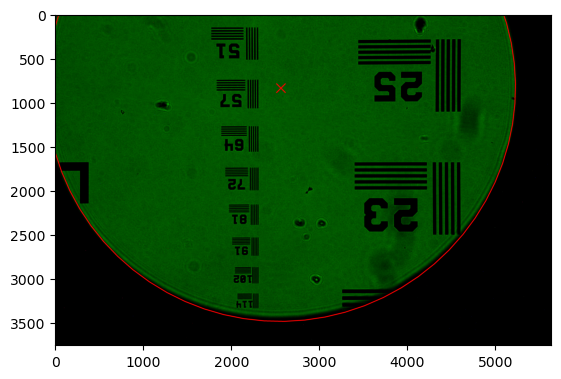

x: 14 y: 18 2023_03_15_16_02_07_img_shutter_05_x_14_y_18_r_0_g_1_b_0.tiff
x:14, y:18, Center:(2566.334482605448, 642.8447964924148), Axis:(2627.3772960355273, 2664.6336025674645), Angle:76.93856837814916


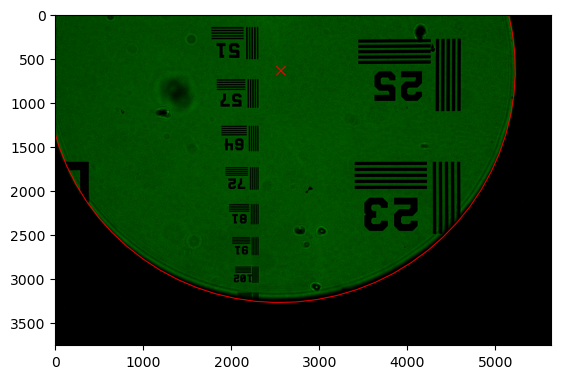

x: 14 y: 19 2023_03_15_16_02_07_img_shutter_05_x_14_y_19_r_0_g_1_b_0.tiff
x:14, y:19, Center:(2559.454613794136, 417.6013989373396), Axis:(2603.45680089895, 2662.7157085505105), Angle:80.2406963167309


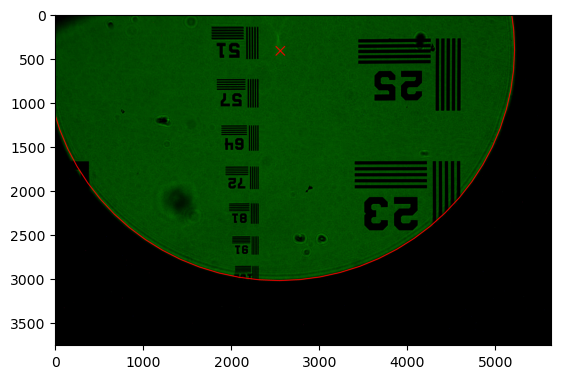

x: 14 y: 20 2023_03_15_16_02_07_img_shutter_05_x_14_y_20_r_0_g_1_b_0.tiff
x:14, y:20, Center:(2545.273044274948, 147.79619891488028), Axis:(2570.824092737263, 2660.8512368869347), Angle:84.21149696835796


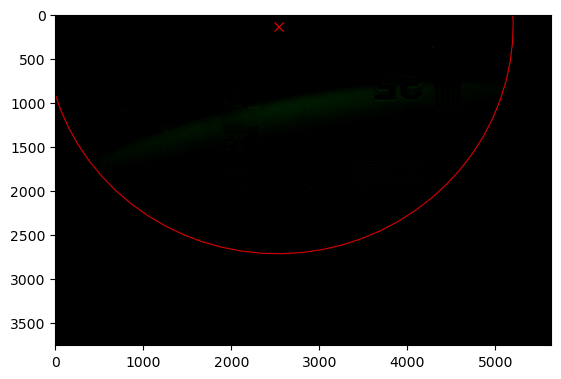

x: 15 y: 10 2023_03_15_16_02_07_img_shutter_05_x_15_y_10_r_0_g_1_b_0.tiff
x:15, y:10, Center:(2758.0, 2280.421944688572), Axis:(2582.4492454288184, 2680.9310268818535), Angle:90.35155057765975


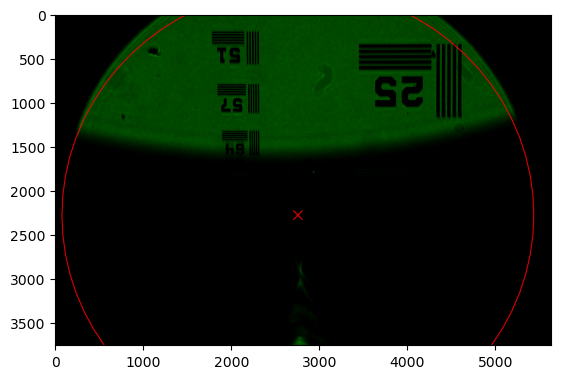

x: 15 y: 11 2023_03_15_16_02_07_img_shutter_05_x_15_y_11_r_0_g_1_b_0.tiff
x:15, y:11, Center:(2758.0, 2013.9988462547005), Axis:(2600.761717882952, 2678.866193270725), Angle:87.56240583742085


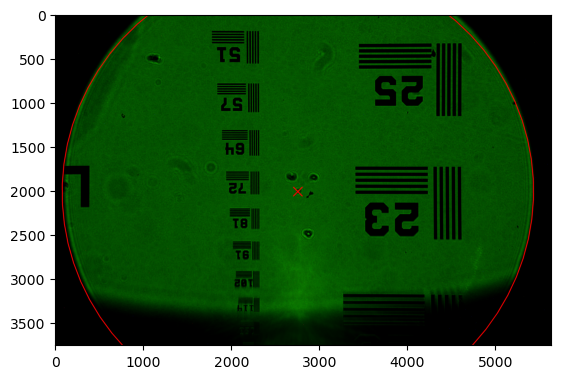

x: 15 y: 12 2023_03_15_16_02_07_img_shutter_05_x_15_y_12_r_0_g_1_b_0.tiff
x:15, y:12, Center:(2758.0, 1792.087338271346), Axis:(2616.4593528227656, 2676.8547820129743), Angle:85.44193381022724


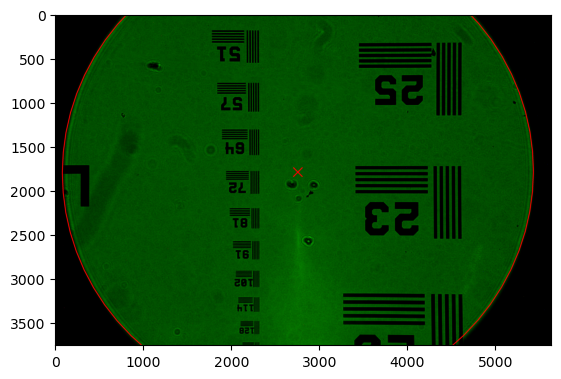

x: 15 y: 13 2023_03_15_16_02_07_img_shutter_05_x_15_y_13_r_0_g_1_b_0.tiff
x:15, y:13, Center:(2758.0, 1597.2451850360694), Axis:(2628.7799783094106, 2674.8967931086017), Angle:83.990134496079


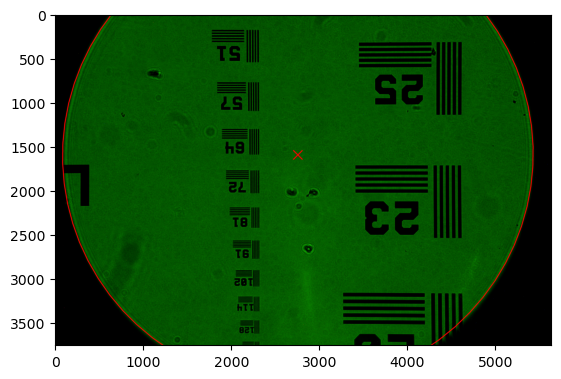

x: 15 y: 14 2023_03_15_16_02_07_img_shutter_05_x_15_y_14_r_0_g_1_b_0.tiff
x:15, y:14, Center:(2758.0, 1412.0301508464336), Axis:(2636.961422404039, 2672.9922265576074), Angle:83.20700789497609


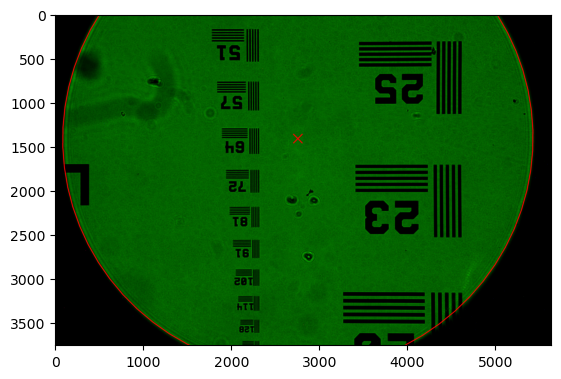

x: 15 y: 15 2023_03_15_16_02_07_img_shutter_05_x_15_y_15_r_0_g_1_b_0.tiff
x:15, y:15, Center:(2758.0, 1219.0), Axis:(2640.2415131678013, 2671.141082359991), Angle:83.09255400691852


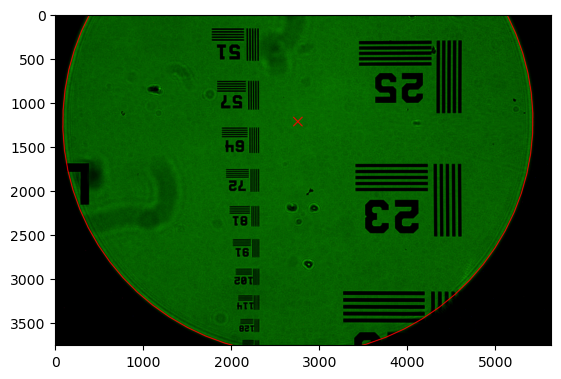

x: 15 y: 16 2023_03_15_16_02_07_img_shutter_05_x_15_y_16_r_0_g_1_b_0.tiff
x:15, y:16, Center:(2758.0, 1025.9698491535664), Axis:(2637.8580786618495, 2669.343360515752), Angle:83.64677283190623


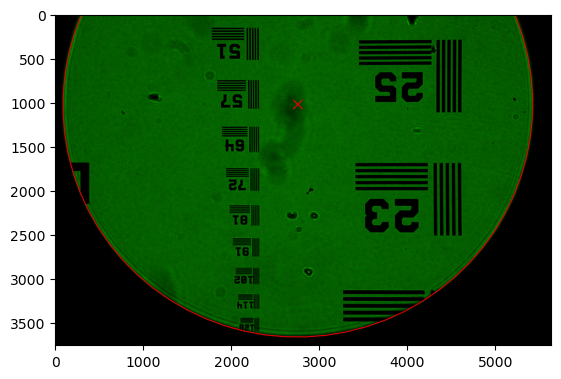

x: 15 y: 17 2023_03_15_16_02_07_img_shutter_05_x_15_y_17_r_0_g_1_b_0.tiff
x:15, y:17, Center:(2758.0, 840.7548149639305), Axis:(2629.048946947334, 2667.5990610248914), Angle:84.86966436993929


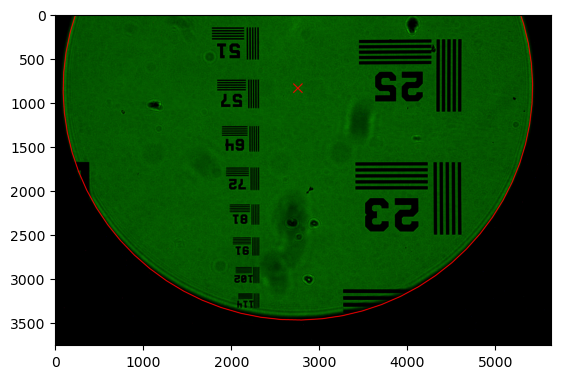

x: 15 y: 18 2023_03_15_16_02_07_img_shutter_05_x_15_y_18_r_0_g_1_b_0.tiff
x:15, y:18, Center:(2758.0, 645.912661728654), Axis:(2613.051946085407, 2665.9081838874085), Angle:86.76122862101768


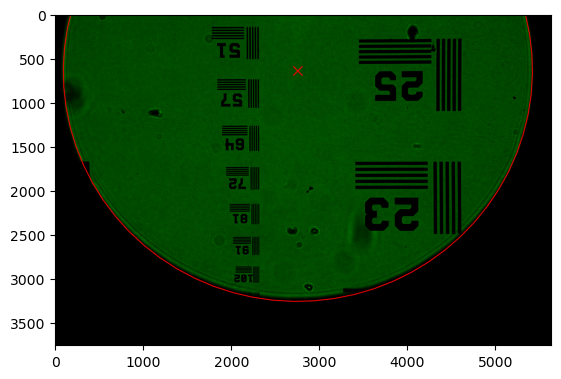

x: 15 y: 19 2023_03_15_16_02_07_img_shutter_05_x_15_y_19_r_0_g_1_b_0.tiff
x:15, y:19, Center:(2758.0, 424.00115374529946), Axis:(2589.104904137219, 2664.270729103304), Angle:89.32146558514141


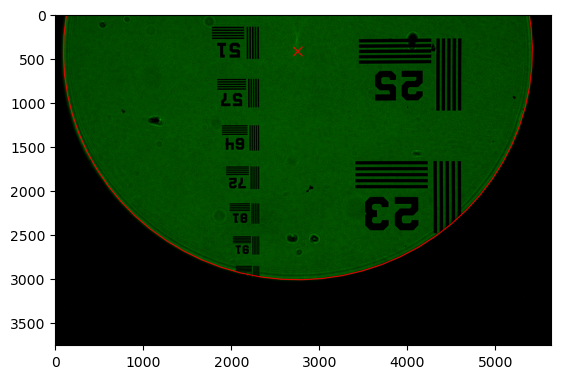

x: 15 y: 20 2023_03_15_16_02_07_img_shutter_05_x_15_y_20_r_0_g_1_b_0.tiff
x:15, y:20, Center:(2758.0, 157.57805531142822), Axis:(2556.4456491639216, 2662.686696672577), Angle:92.55037526231042


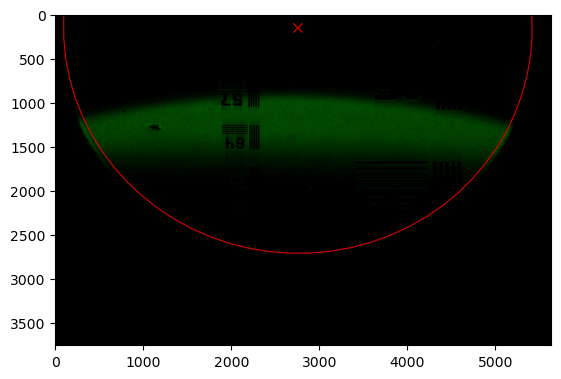

x: 16 y: 10 2023_03_15_16_02_07_img_shutter_05_x_16_y_10_r_0_g_1_b_0.tiff
x:16, y:10, Center:(2970.726955725052, 2290.2038010851197), Axis:(2566.4389440844075, 2680.004313158133), Angle:107.05742487907698


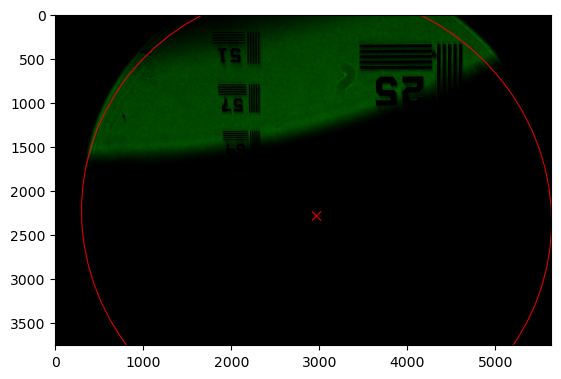

x: 16 y: 11 2023_03_15_16_02_07_img_shutter_05_x_16_y_11_r_0_g_1_b_0.tiff
x:16, y:11, Center:(2956.545386205864, 2020.3986010626604), Axis:(2584.7248697269306, 2678.2199187798533), Angle:103.52638916438009


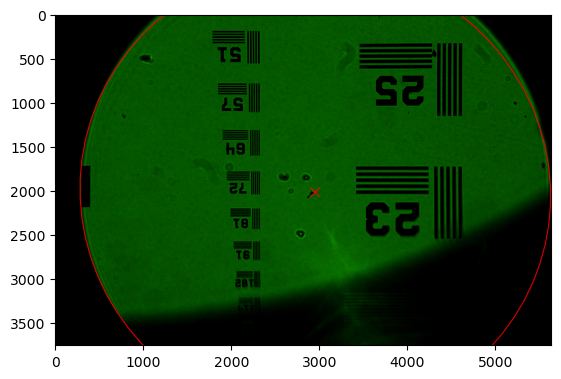

x: 16 y: 12 2023_03_15_16_02_07_img_shutter_05_x_16_y_12_r_0_g_1_b_0.tiff
x:16, y:12, Center:(2949.665517394552, 1795.1552035075852), Axis:(2600.3959578551335, 2676.488946754952), Angle:100.66402616272849


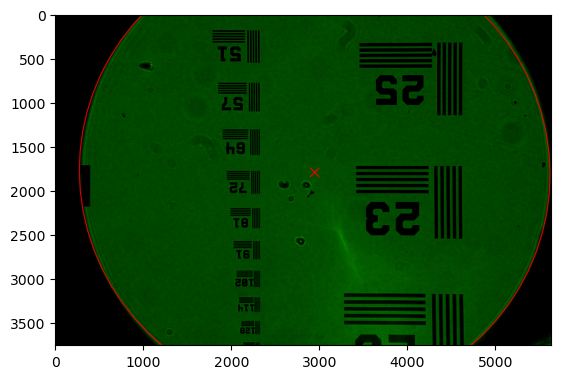

x: 16 y: 13 2023_03_15_16_02_07_img_shutter_05_x_16_y_13_r_0_g_1_b_0.tiff
x:16, y:13, Center:(2949.624988275638, 1597.1355972637948), Axis:(2612.6900365301685, 2674.8113970834283), Angle:98.47033587412223


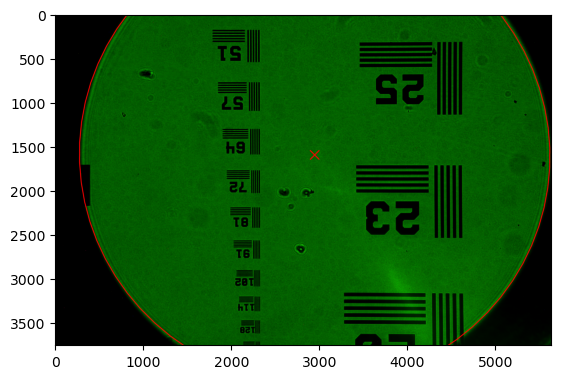

x: 16 y: 14 2023_03_15_16_02_07_img_shutter_05_x_16_y_14_r_0_g_1_b_0.tiff
x:16, y:14, Center:(2954.844097465464, 1409.4438798530268), Axis:(2620.8449338131863, 2673.1872697652825), Angle:96.94531829856128


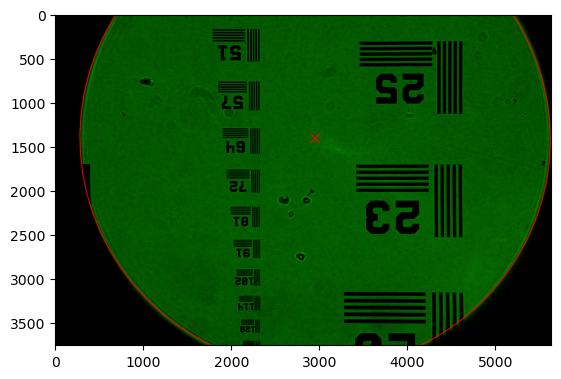

x: 16 y: 15 2023_03_15_16_02_07_img_shutter_05_x_16_y_15_r_0_g_1_b_0.tiff
x:16, y:15, Center:(2959.1718406532095, 1219.0), Axis:(2624.0984777653384, 2671.616564800515), Angle:96.08897343604566


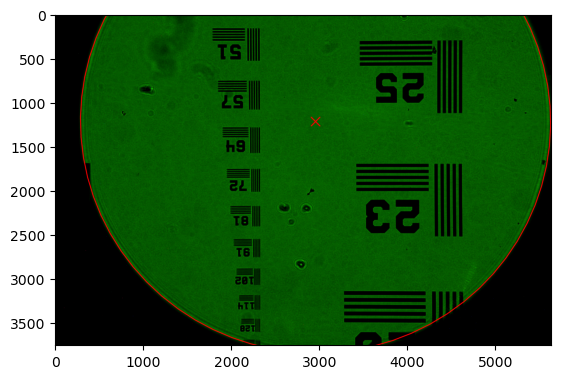

x: 16 y: 16 2023_03_15_16_02_07_img_shutter_05_x_16_y_16_r_0_g_1_b_0.tiff
x:16, y:16, Center:(2954.844097465464, 1028.5561201469732), Axis:(2621.688496447776, 2670.0992821891255), Angle:95.90130128657539


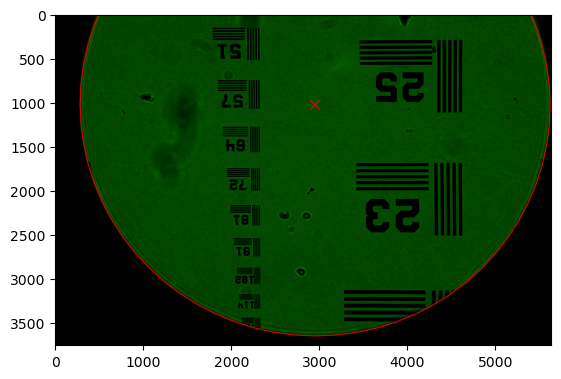

x: 16 y: 17 2023_03_15_16_02_07_img_shutter_05_x_16_y_17_r_0_g_1_b_0.tiff
x:16, y:17, Center:(2949.624988275638, 840.8644027362052), Axis:(2612.85281792165, 2668.635421931114), Angle:96.3823018501504


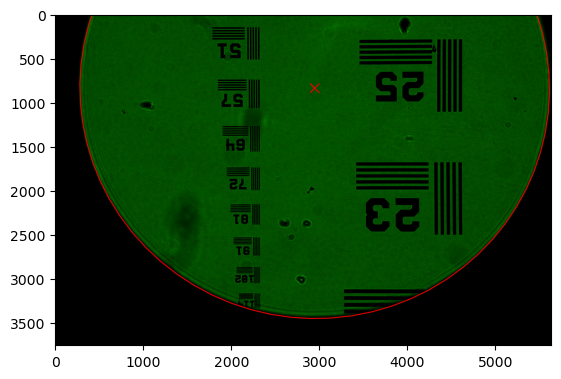

x: 16 y: 18 2023_03_15_16_02_07_img_shutter_05_x_16_y_18_r_0_g_1_b_0.tiff
x:16, y:18, Center:(2949.665517394552, 642.8447964924148), Axis:(2596.8292702481126, 2667.2249840264803), Angle:97.53197512677077


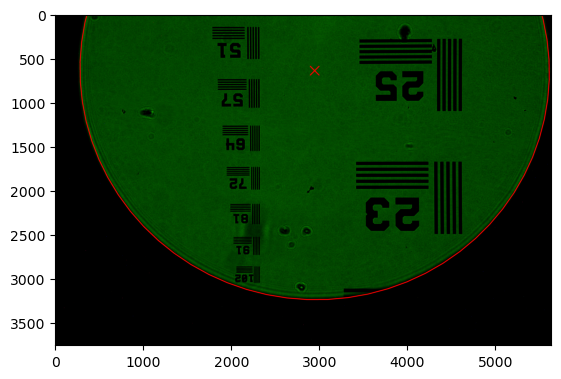

x: 16 y: 19 2023_03_15_16_02_07_img_shutter_05_x_16_y_19_r_0_g_1_b_0.tiff
x:16, y:19, Center:(2956.545386205864, 417.6013989373396), Axis:(2572.855681488314, 2665.867968475224), Angle:99.35032111643652


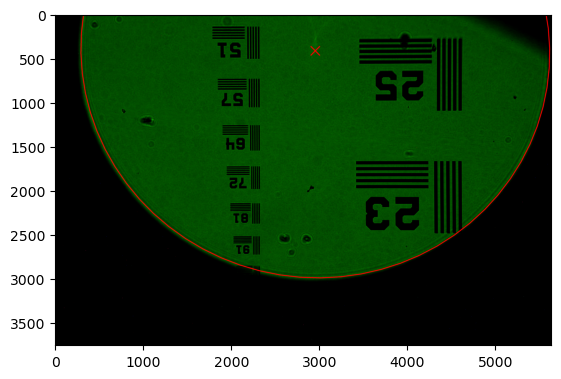

x: 16 y: 20 2023_03_15_16_02_07_img_shutter_05_x_16_y_20_r_0_g_1_b_0.tiff
x:16, y:20, Center:(2970.726955725052, 147.79619891488028), Axis:(2540.1698797034064, 2664.5643752773467), Angle:101.83733981914754


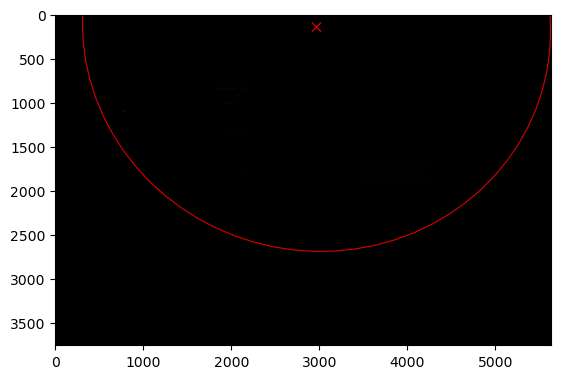

x: 17 y: 10 2023_03_15_16_02_07_img_shutter_05_x_17_y_10_r_0_g_1_b_0.tiff
x:17, y:10, Center:(3196.5804186758464, 2320.49269694551), Axis:(2548.4099579971075, 2679.119818253539), Angle:124.71138544337886


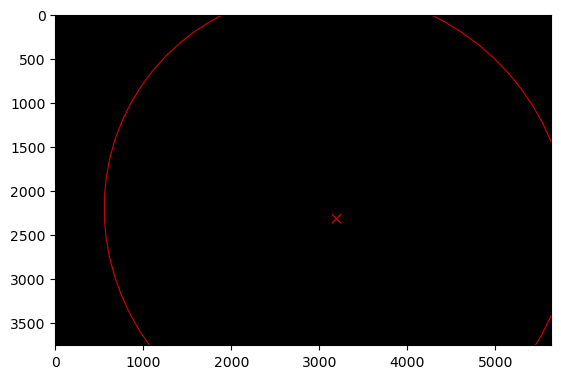

x: 17 y: 11 2023_03_15_16_02_07_img_shutter_05_x_17_y_11_r_0_g_1_b_0.tiff
x:17, y:11, Center:(3165.2036977269017, 2040.989985495978), Axis:(2566.66933682802, 2677.615863108109), Angle:120.4384587542239


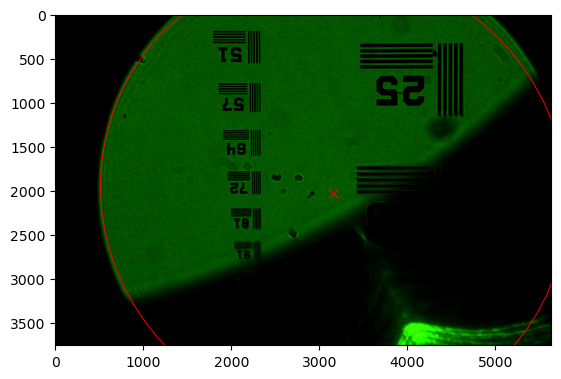

x: 17 y: 12 2023_03_15_16_02_07_img_shutter_05_x_17_y_12_r_0_g_1_b_0.tiff
x:17, y:12, Center:(3146.995569089374, 1806.5692465159727), Axis:(2582.3138781446128, 2676.1653303160565), Angle:116.83420477811431


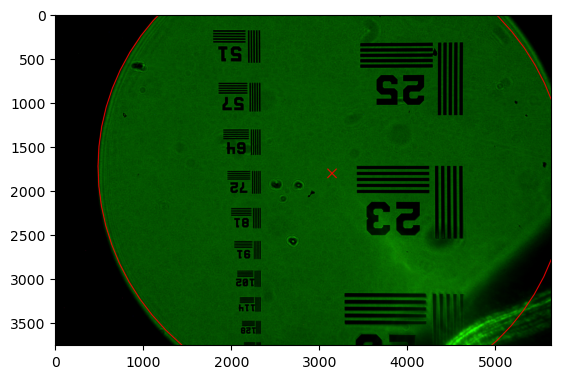

x: 17 y: 13 2023_03_15_16_02_07_img_shutter_05_x_17_y_13_r_0_g_1_b_0.tiff
x:17, y:13, Center:(3140.07530781173, 1600.6148462276306), Axis:(2594.581410008037, 2674.768219877382), Angle:113.89862351505


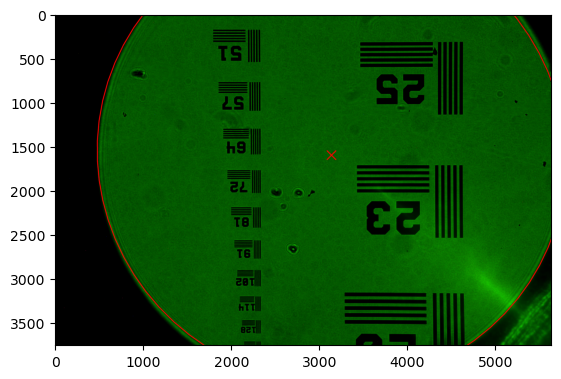

x: 17 y: 14 2023_03_15_16_02_07_img_shutter_05_x_17_y_14_r_0_g_1_b_0.tiff
x:17, y:14, Center:(3140.5532472358154, 1408.1760575773023), Axis:(2602.7097604794444, 2673.4245317920854), Angle:111.63171496503104


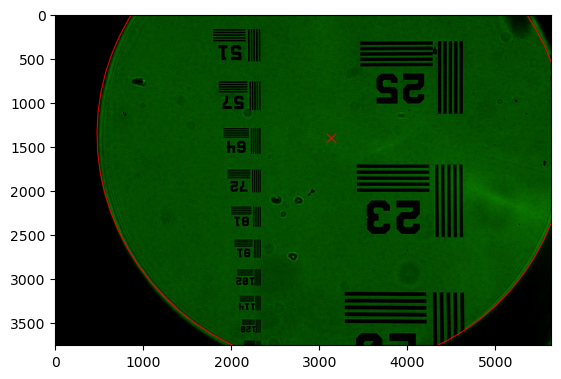

x: 17 y: 15 2023_03_15_16_02_07_img_shutter_05_x_17_y_15_r_0_g_1_b_0.tiff
x:17, y:15, Center:(3142.051338337887, 1219.0), Axis:(2605.936757619986, 2672.1342660601667), Angle:110.03347912805741


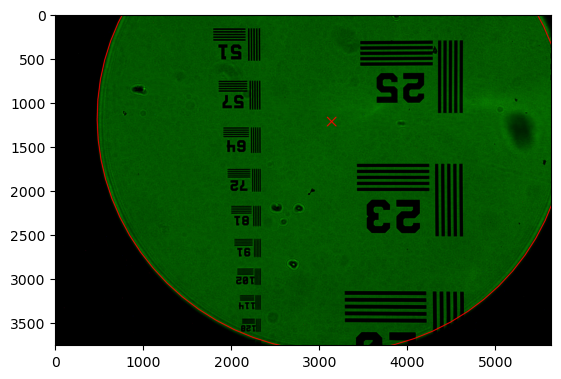

x: 17 y: 16 2023_03_15_16_02_07_img_shutter_05_x_17_y_16_r_0_g_1_b_0.tiff
x:17, y:16, Center:(3140.5532472358154, 1029.8239424226977), Axis:(2603.500229490813, 2670.8974226816263), Angle:109.10391600412912


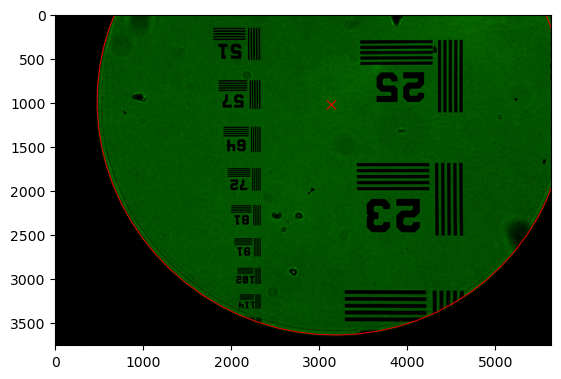

x: 17 y: 17 2023_03_15_16_02_07_img_shutter_05_x_17_y_17_r_0_g_1_b_0.tiff
x:17, y:17, Center:(3140.07530781173, 837.3851537723693), Axis:(2594.638004153077, 2669.7140016564636), Angle:108.84302559324614


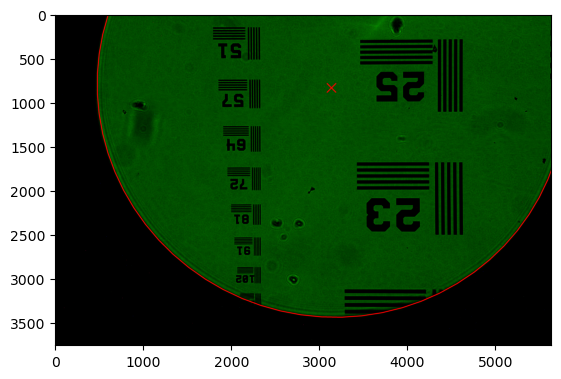

x: 17 y: 18 2023_03_15_16_02_07_img_shutter_05_x_17_y_18_r_0_g_1_b_0.tiff
x:17, y:18, Center:(3146.995569089374, 631.4307534840273), Axis:(2578.587909667929, 2668.584002984679), Angle:109.25080789540853


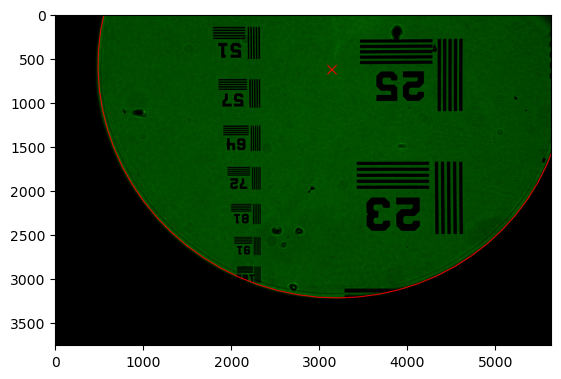

x: 17 y: 19 2023_03_15_16_02_07_img_shutter_05_x_17_y_19_r_0_g_1_b_0.tiff
x:17, y:19, Center:(3165.2036977269017, 397.0100145040219), Axis:(2554.58777409652, 2667.5074266662723), Angle:110.32726291061617


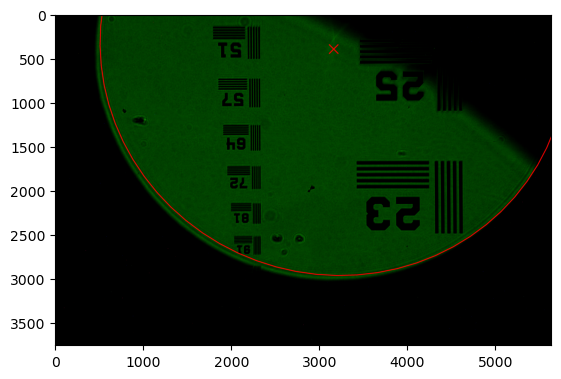

x: 17 y: 20 2023_03_15_16_02_07_img_shutter_05_x_17_y_20_r_0_g_1_b_0.tiff
x:17, y:20, Center:(3196.5804186758464, 117.5073030544902), Axis:(2521.875425500002, 2666.4842727012438), Angle:112.07239063886921


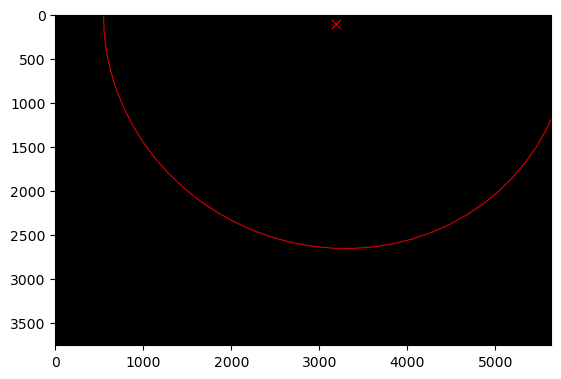

x: 18 y: 10 2023_03_15_16_02_07_img_shutter_05_x_18_y_10_r_0_g_1_b_0.tiff
x:18, y:10, Center:(3451.2966198736035, 2373.600825103962), Axis:(2528.240928311203, 2678.277542168073), Angle:143.31343227056533


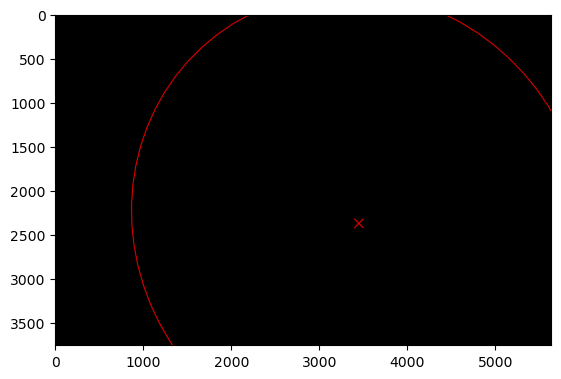

x: 18 y: 11 2023_03_15_16_02_07_img_shutter_05_x_18_y_11_r_0_g_1_b_0.tiff
x:18, y:11, Center:(3398.5309464452157, 2078.886462109216), Axis:(2546.473760330505, 2677.0540262554914), Angle:138.29861460695236


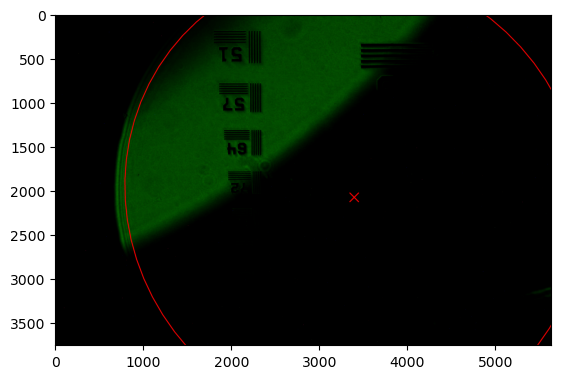

x: 18 y: 12 2023_03_15_16_02_07_img_shutter_05_x_18_y_12_r_0_g_1_b_0.tiff
x:18, y:12, Center:(3363.826073102265, 1830.527252574032), Axis:(2562.091754835487, 2675.883932696288), Angle:133.95246965638472


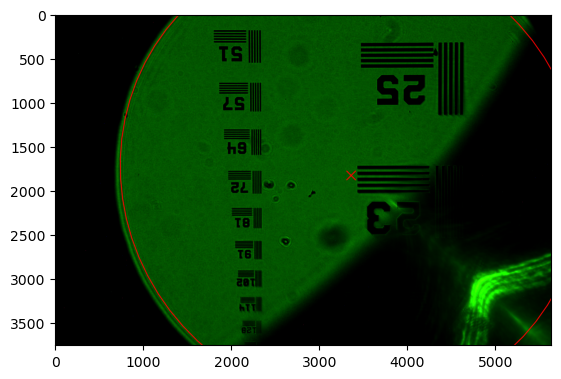

x: 18 y: 13 2023_03_15_16_02_07_img_shutter_05_x_18_y_13_r_0_g_1_b_0.tiff
x:18, y:13, Center:(3344.3339089238707, 1612.918523295742), Axis:(2574.332739887301, 2674.7672614904627), Angle:130.27499741886243


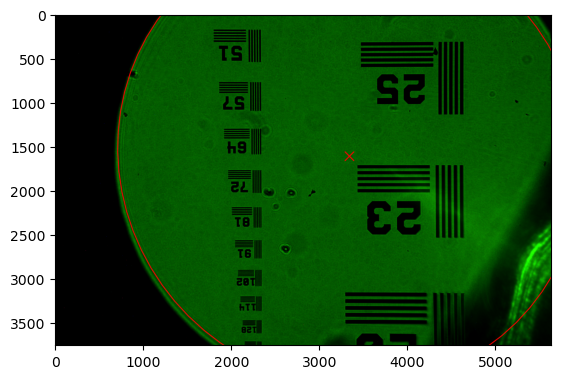

x: 18 y: 14 2023_03_15_16_02_07_img_shutter_05_x_18_y_14_r_0_g_1_b_0.tiff
x:18, y:14, Center:(3335.858460161084, 1412.4775110581206), Axis:(2582.434543547098, 2673.7040126380152), Angle:127.26619789438543


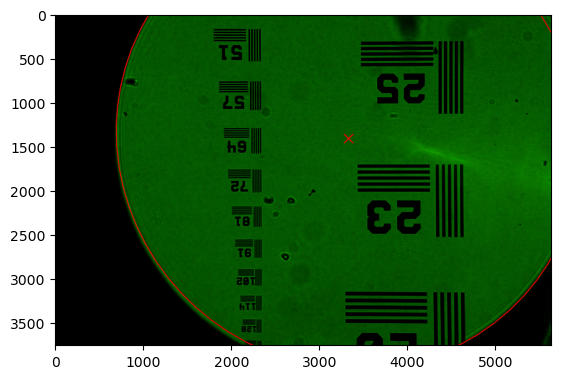

x: 18 y: 15 2023_03_15_16_02_07_img_shutter_05_x_18_y_15_r_0_g_1_b_0.tiff
x:18, y:15, Center:(3333.7685217802627, 1219.0), Axis:(2585.634993876029, 2672.6941861389455), Angle:124.92607108295378


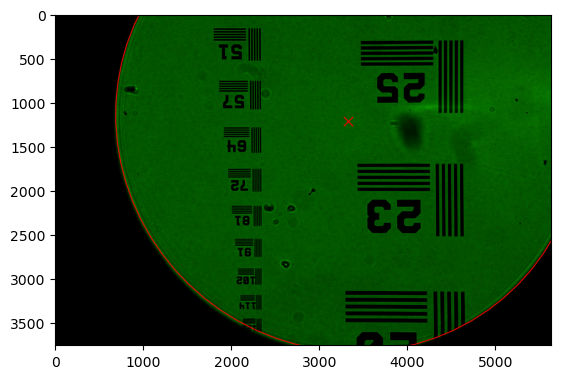

x: 18 y: 16 2023_03_15_16_02_07_img_shutter_05_x_18_y_16_r_0_g_1_b_0.tiff
x:18, y:16, Center:(3335.858460161084, 1025.5224889418794), Axis:(2583.1719189352457, 2671.737781993254), Angle:123.25461698456748


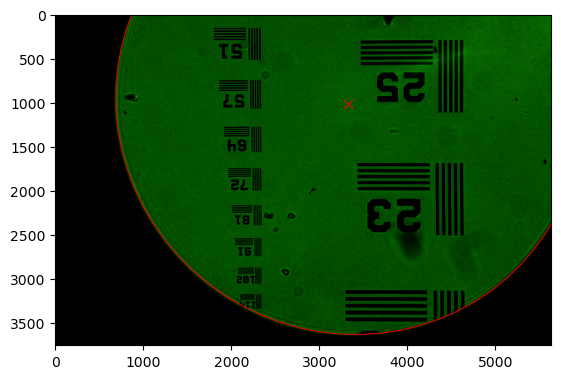

x: 18 y: 17 2023_03_15_16_02_07_img_shutter_05_x_18_y_17_r_0_g_1_b_0.tiff
x:18, y:17, Center:(3344.3339089238707, 825.0814767042579), Axis:(2574.283146785899, 2670.8348002009407), Angle:122.25183559922648


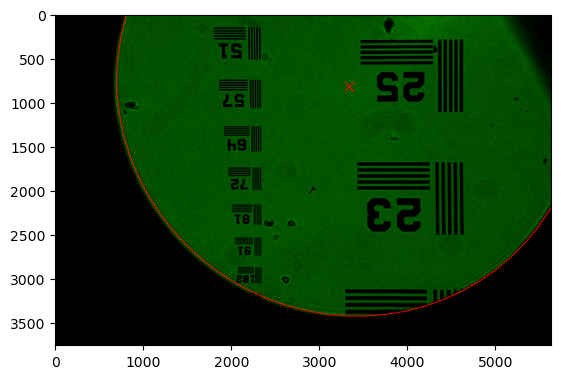

x: 18 y: 18 2023_03_15_16_02_07_img_shutter_05_x_18_y_18_r_0_g_1_b_0.tiff
x:18, y:18, Center:(3363.826073102265, 607.472747425968), Axis:(2558.206505489141, 2669.985240762005), Angle:121.91772692693083


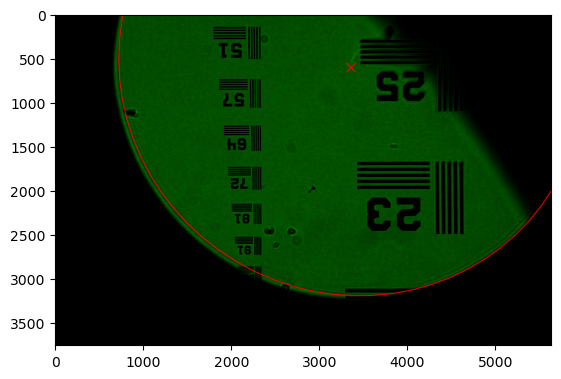

x: 18 y: 19 2023_03_15_16_02_07_img_shutter_05_x_18_y_19_r_0_g_1_b_0.tiff
x:18, y:19, Center:(3398.5309464452157, 359.1135378907836), Axis:(2534.1798231061216, 2669.1891036764473), Angle:122.25229096768045


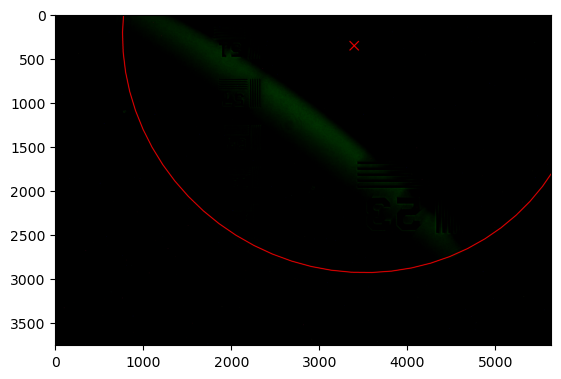

x: 18 y: 20 2023_03_15_16_02_07_img_shutter_05_x_18_y_20_r_0_g_1_b_0.tiff
x:18, y:20, Center:(3451.2966198736035, 64.39917489603795), Axis:(2501.440927697993, 2668.4463889442677), Angle:123.25552772147545


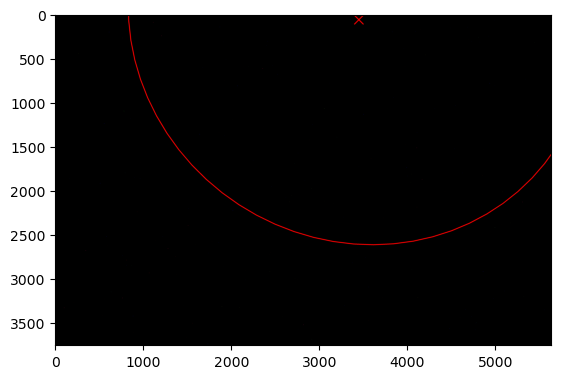

x: 19 y: 10 2023_03_15_16_02_07_img_shutter_05_x_19_y_10_r_0_g_1_b_0.tiff
x:19, y:10, Center:(3754.1539107390513, 2452.2019908219063), Axis:(2505.810496170978, 2677.477484901734), Angle:162.86356536063641


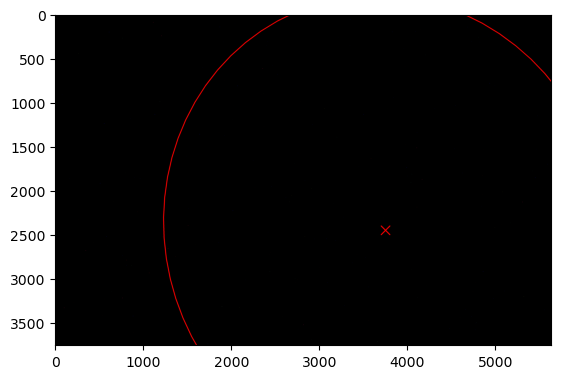

x: 19 y: 11 2023_03_15_16_02_07_img_shutter_05_x_19_y_11_r_0_g_1_b_0.tiff
x:19, y:11, Center:(3676.228835400537, 2137.195452342451), Axis:(2524.0167813786693, 2676.5344082220017), Angle:157.1068567225654


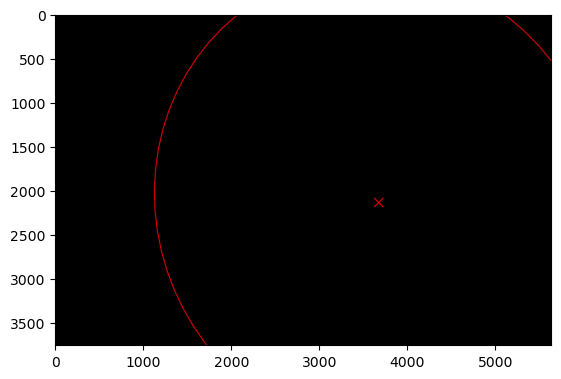

x: 19 y: 12 2023_03_15_16_02_07_img_shutter_05_x_19_y_12_r_0_g_1_b_0.tiff
x:19, y:12, Center:(3621.237480111168, 1870.3103867510222), Axis:(2539.6082290720415, 2675.644753895647), Angle:152.01882079753977


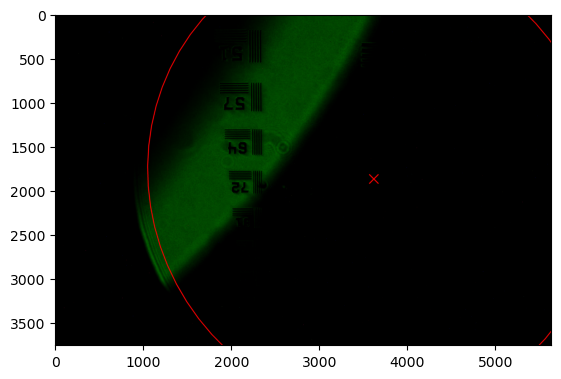

x: 19 y: 13 2023_03_15_16_02_07_img_shutter_05_x_19_y_13_r_0_g_1_b_0.tiff
x:19, y:13, Center:(3586.130939747929, 1636.6877926202976), Axis:(2551.822667312245, 2674.808521922671), Angle:147.59945758555943


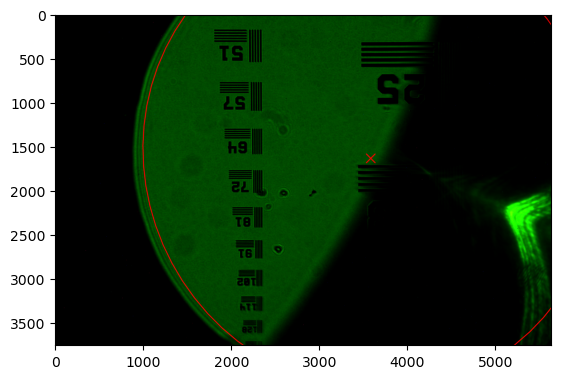

x: 19 y: 14 2023_03_15_16_02_07_img_shutter_05_x_19_y_14_r_0_g_1_b_0.tiff
x:19, y:14, Center:(3567.284708210969, 1423.222966277605), Axis:(2559.8979241604316, 2674.0257123030724), Angle:143.84876708662443


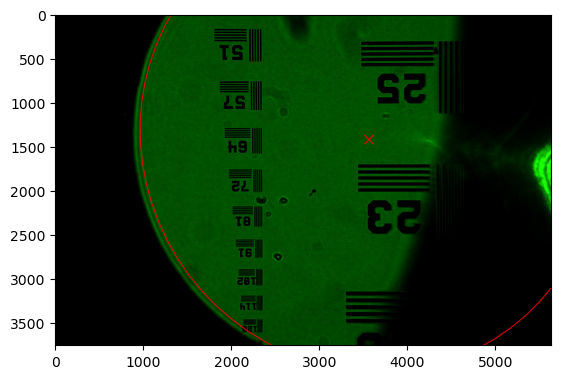

x: 19 y: 15 2023_03_15_16_02_07_img_shutter_05_x_19_y_15_r_0_g_1_b_0.tiff
x:19, y:15, Center:(3561.4534197065655, 1219.0), Axis:(2563.071827677752, 2673.296325036852), Angle:140.76674930073477


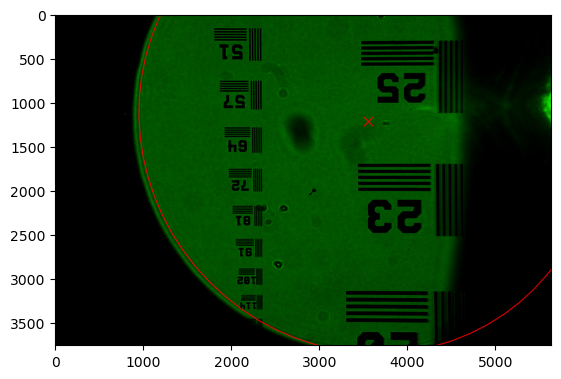

x: 19 y: 16 2023_03_15_16_02_07_img_shutter_05_x_19_y_16_r_0_g_1_b_0.tiff
x:19, y:16, Center:(3567.284708210969, 1014.7770337223949), Axis:(2560.5822059253587, 2672.6203601240095), Angle:138.35340422789045


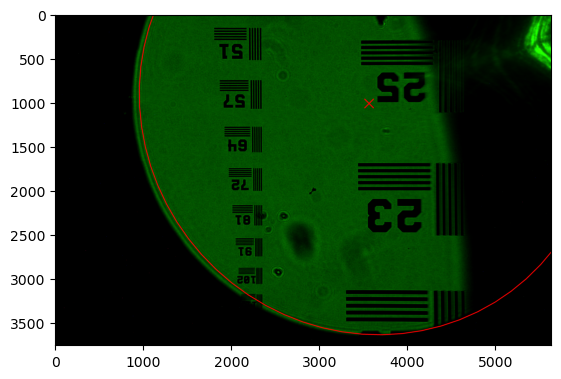

x: 19 y: 17 2023_03_15_16_02_07_img_shutter_05_x_19_y_17_r_0_g_1_b_0.tiff
x:19, y:17, Center:(3586.130939747929, 801.3122073797024), Axis:(2551.6668869644013, 2671.9978175645447), Angle:136.60873186809147


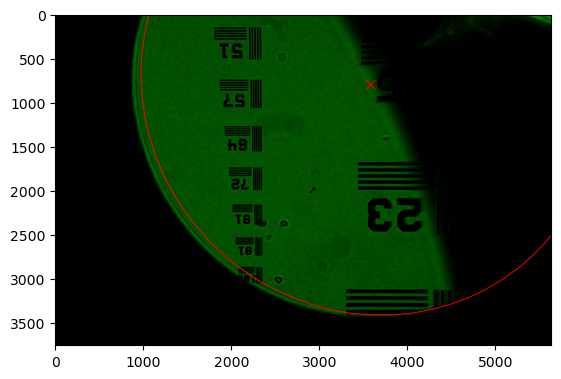

x: 19 y: 18 2023_03_15_16_02_07_img_shutter_05_x_19_y_18_r_0_g_1_b_0.tiff
x:19, y:18, Center:(3621.237480111168, 567.6896132489779), Axis:(2535.5636988560327, 2671.4286973584585), Angle:135.5327322213377


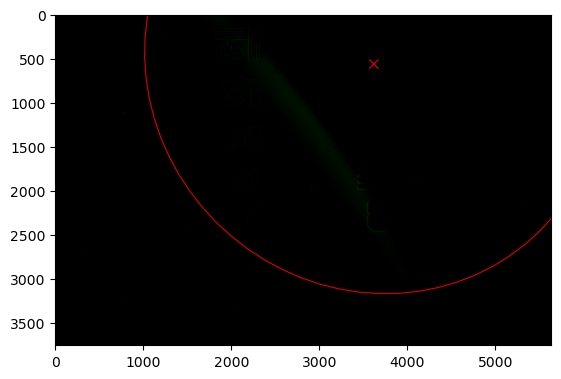

x: 19 y: 19 2023_03_15_16_02_07_img_shutter_05_x_19_y_19_r_0_g_1_b_0.tiff
x:19, y:19, Center:(3676.228835400537, 300.8045476575487), Axis:(2511.510469661403, 2670.9129995057497), Angle:135.12540528762935


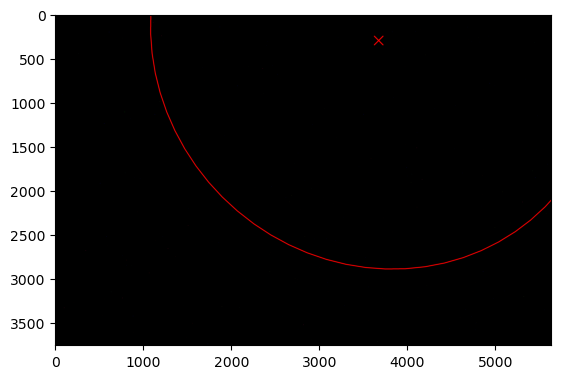

x: 19 y: 20 2023_03_15_16_02_07_img_shutter_05_x_19_y_20_r_0_g_1_b_0.tiff
x:19, y:20, Center:(3754.1539107390513, -14.201990821906293), Axis:(2478.7450274416638, 2670.450724006419), Angle:135.38675106696633


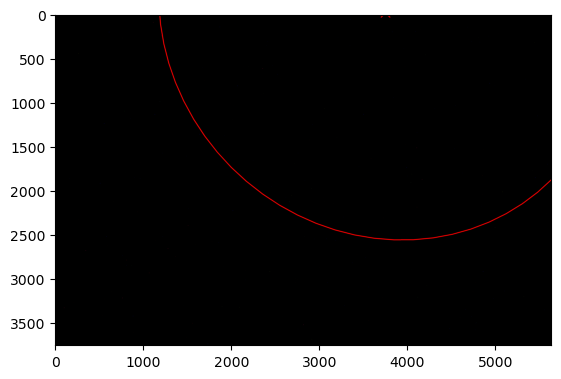

x: 20 y: 10 2023_03_15_16_02_07_img_shutter_05_x_20_y_10_r_0_g_1_b_0.tiff
x:20, y:10, Center:(4127.4160367700115, 2558.633798983109), Axis:(2480.9973027207175, 2676.7196464545223), Angle:183.361784713592


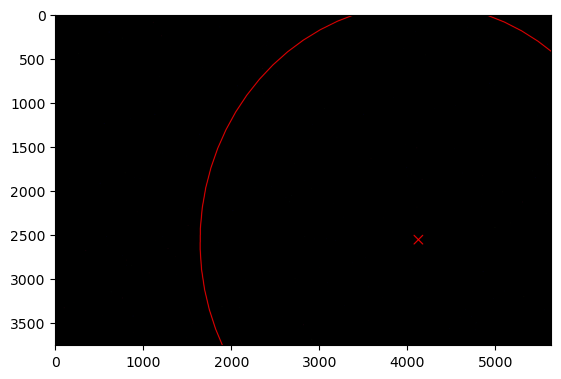

x: 20 y: 11 2023_03_15_16_02_07_img_shutter_05_x_20_y_11_r_0_g_1_b_0.tiff
x:20, y:11, Center:(4021.517338560693, 2218.2381539222356), Axis:(2499.1770411167986, 2676.057009007639), Angle:176.86318510106304


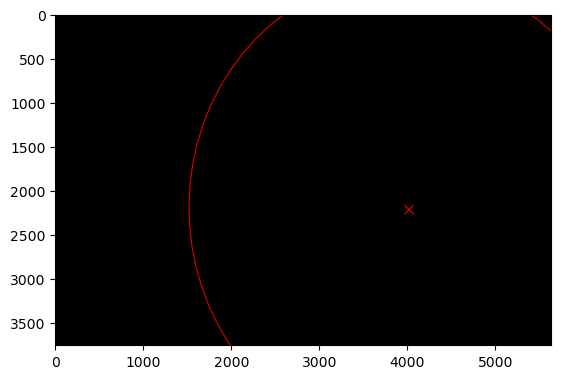

x: 20 y: 12 2023_03_15_16_02_07_img_shutter_05_x_20_y_12_r_0_g_1_b_0.tiff
x:20, y:12, Center:(3943.8647818169006, 1927.8628089859549), Axis:(2514.74194199856, 2675.447793914134), Angle:171.03325820157932


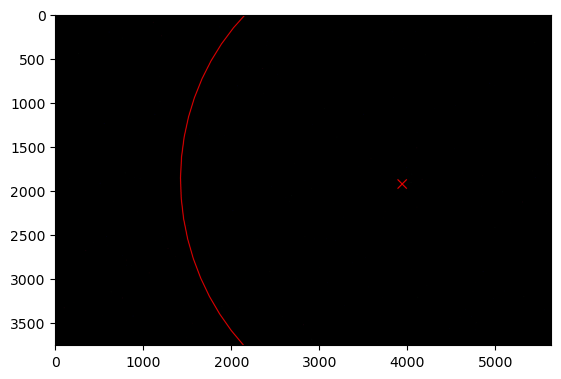

x: 20 y: 13 2023_03_15_16_02_07_img_shutter_05_x_20_y_13_r_0_g_1_b_0.tiff
x:20, y:13, Center:(3891.6234199945375, 1673.0371105366182), Axis:(2526.9298334271534, 2674.8920011740065), Angle:165.872004015141


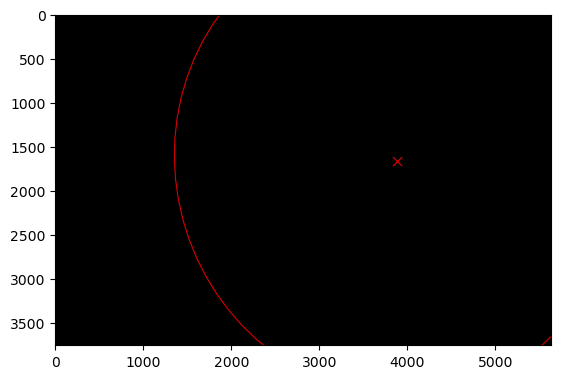

x: 20 y: 14 2023_03_15_16_02_07_img_shutter_05_x_20_y_14_r_0_g_1_b_0.tiff
x:20, y:14, Center:(3861.8570833315157, 1440.6477717284338), Axis:(2534.9785434637292, 2674.389630787257), Angle:161.379422541748


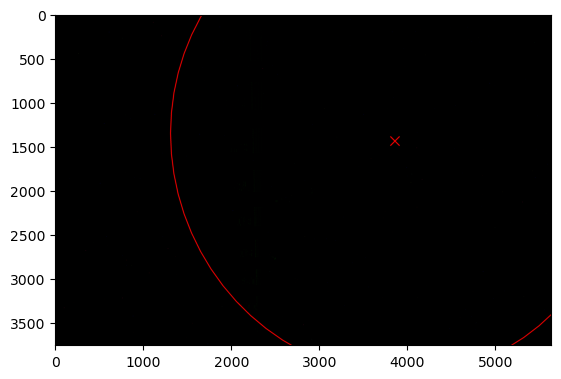

x: 20 y: 15 2023_03_15_16_02_07_img_shutter_05_x_20_y_15_r_0_g_1_b_0.tiff
x:20, y:15, Center:(3852.2360608430254, 1219.0), Axis:(2538.12590016944, 2673.9406827538855), Angle:157.5555137814003


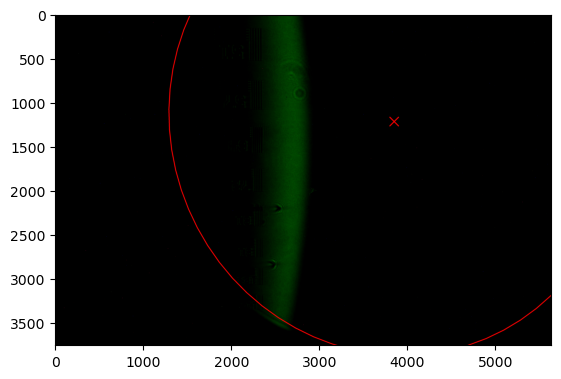

x: 20 y: 16 2023_03_15_16_02_07_img_shutter_05_x_20_y_16_r_0_g_1_b_0.tiff
x:20, y:16, Center:(3861.8570833315157, 997.3522282715662), Axis:(2535.6097316054356, 2673.545157073892), Angle:154.40027773409793


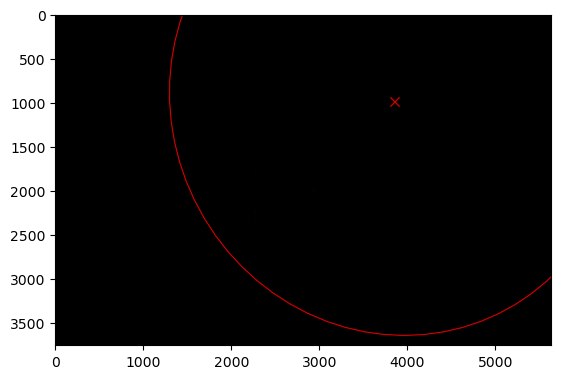

x: 20 y: 17 2023_03_15_16_02_07_img_shutter_05_x_20_y_17_r_0_g_1_b_0.tiff
x:20, y:17, Center:(3891.6234199945375, 764.9628894633818), Axis:(2526.6678658328683, 2673.2030537472765), Angle:151.9137143998409


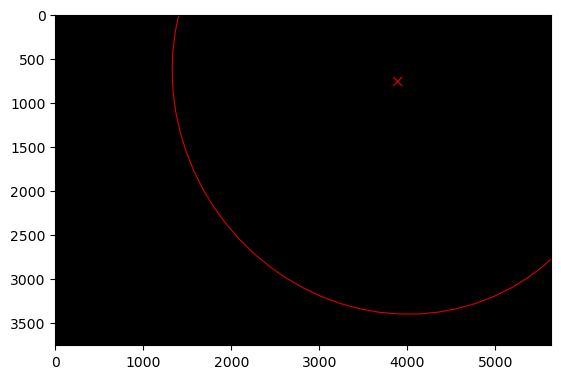

x: 20 y: 18 2023_03_15_16_02_07_img_shutter_05_x_20_y_18_r_0_g_1_b_0.tiff
x:20, y:18, Center:(3943.8647818169006, 510.13719101404513), Axis:(2510.538130912889, 2672.914372774039), Angle:150.09582377862915


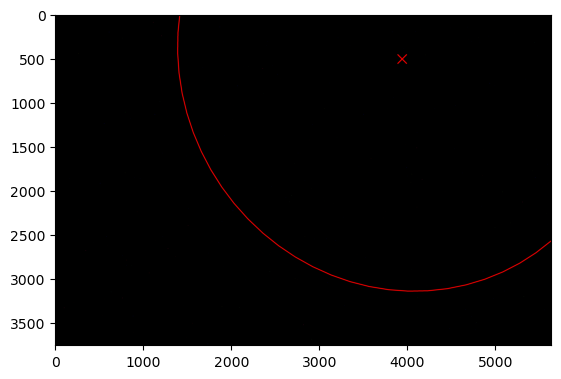

x: 20 y: 19 2023_03_15_16_02_07_img_shutter_05_x_20_y_19_r_0_g_1_b_0.tiff
x:20, y:19, Center:(4021.517338560693, 219.7618460777643), Axis:(2486.4583549066488, 2672.6791141541794), Angle:148.9466058704628


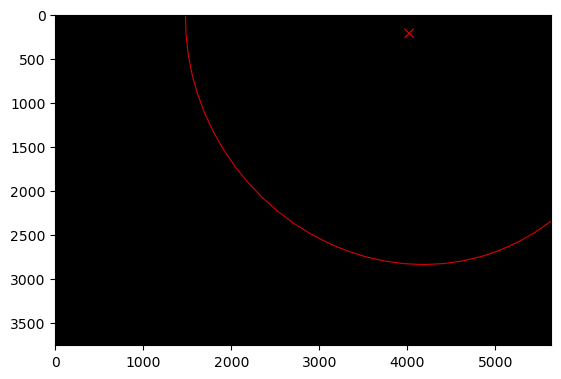

x: 20 y: 20 2023_03_15_16_02_07_img_shutter_05_x_20_y_20_r_0_g_1_b_0.tiff
x:20, y:20, Center:(4127.4160367700115, -120.63379898310905), Axis:(2453.666365875299, 2672.4972778876977), Angle:148.4660606753418


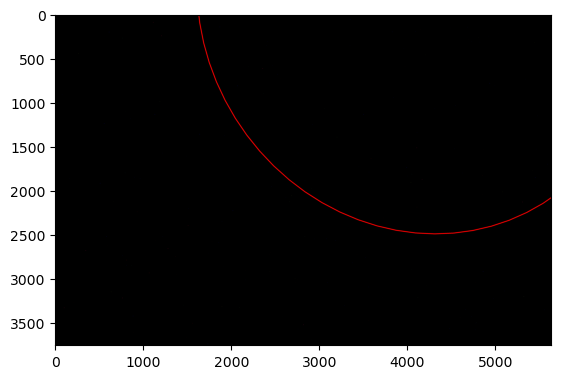

In [41]:
extrap_centers = np.loadtxt('extrap_280923/center_cords_extended_extrap.txt').reshape(11, 11, 2)
extrap_axis_lens = np.loadtxt('extrap_280923/axis_lens_entended_extrap.txt').reshape(11, 11, 2)
extrap_angles = np.loadtxt('extrap_280923/angles_extended_extrap.txt').reshape(11, 11)

for x in range(10, 21):
    for y in range(10, 21):

        dir_path = "Z:/CSE\CSE-Research/Microscopy3D/CV_CSE_Collaboration/Results/CV_CSE/fpm_capture/output/2023_03_15/2023_03_15_16_02_07/"
        file_path = f"2023_03_15_16_02_07_img_shutter_05_x_{x}_y_{y}_r_0_g_1_b_0.tiff"
        print('x:', x, 'y:', y, file_path)

        img = cv2.imread(dir_path + file_path, cv2.IMREAD_UNCHANGED)
        img_8 = cv2.convertScaleAbs(img, alpha=(255/65535))
        
        x_cnt, y_cnt = extrap_centers[x-10, y-10]
        len_0, len_1 = extrap_axis_lens[x-10, y-10]

        draw_cross(img_8, (int(x_cnt), int(y_cnt)), (255, 0, 0))
        cv2.ellipse(img_8, (int(x_cnt), int(y_cnt)), (int(len_0), int(len_1)), int(extrap_angles[x-10, y-10]), 0, 360, (255, 0, 0), 10)

        print(f'x:{x}, y:{y}, Center:{x_cnt, y_cnt}, Axis:{len_0, len_1}, Angle:{extrap_angles[x-10, y-10]}')

        plt.imshow(img_8)
        plt.show()

        # break
    # break